In [2]:
import pandas as pd
import numpy as np
import random
from datetime import date
import geopandas as gpd
import os

from PIL import Image
from matplotlib.patches import ConnectionPatch
from IPython.display import Image
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import matplotlib.patches as mpatches
from shapely.geometry import mapping
import matplotlib.colors as mcolors

import pygris
from pygris import tracts 
from pygris import block_groups 
from pygris import primary_secondary_roads
from pygris import school_districts
from pygris import counties 
from pygris.geocode import geocode

from census import Census
# Builing a Compartmetal Model

from sympy import Max,  parse_expr
from sympy import symbols, Matrix

from epymorph import *
from epymorph.compartment_model import *

# Runing the Simulation
from functools import partial

import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from geopandas import GeoDataFrame, GeoSeries

# Building a geo 
from typing import cast


from epymorph.data_shape import Shapes



In [2]:
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.patches import Patch
import imageio
import os

# Creating Measles Geo


In [8]:
CentroidDType = np.dtype([('longitude', np.float64), ('latitude', np.float64)])

In [9]:
# load up a starter geo
geo = cast(StaticGeo, geo_library['maricopa_cbg_2019']())

# create a new values dictionary by over-writing 'population'
# using the dictionary pipe operator!
new_values = geo.values | {
    'population': geo['population_by_age'][:, 0],
}

# construct a new geo with the same spec but our updated values
new_geo = StaticGeo(
    spec=geo.spec,
    values=new_values,
)

# to save this geo as a .geo.tar in my cache directory:
save_to_cache(new_geo, 'measles_geo')

# sometime later when I want to load that geo...
loaded_geo = load_from_cache('measles_geo')

AttributeException: Attribute not found in geo: 'population_by_age'

In [10]:
dir = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/Movement_model')
dir_2 = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/')

powerpoint = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/powerpoints/School_movement_01-22-24')
census = Census('98a3a86a5708b65b92a50cc76d8d67280efbeb5d')

In [11]:
geo_library

OrderedDict([('maricopa_cbg_2019',
              <function epymorph.data.registry._geo_archive_loader.<locals>.load() -> epymorph.geo.static.StaticGeo>),
             ('pei',
              <function epymorph.data.registry._geo_archive_loader.<locals>.load() -> epymorph.geo.static.StaticGeo>),
             ('single_pop',
              <function epymorph.data.geo.single_pop.load() -> epymorph.geo.static.StaticGeo>),
             ('us_counties_2015',
              <function epymorph.data.registry._geo_archive_loader.<locals>.load() -> epymorph.geo.static.StaticGeo>),
             ('us_states_2015',
              <function epymorph.data.registry._geo_archive_loader.<locals>.load() -> epymorph.geo.static.StaticGeo>),
             ('us_sw_counties_2015',
              <function epymorph.data.registry._geo_spec_loader.<locals>.load() -> epymorph.geo.dynamic.DynamicGeo>)])

In [13]:
import pandas as pd
import numpy as np

# Get the data from geo_library
geo_data = geo_library['pei']().values

# Check the structure of the data
for key, value in geo_data.items():
    print(f"Key: {key}, Type: {type(value)}, Shape: {np.shape(value)}")

# Ensure all arrays are 1-dimensional and convert to lists
normalized_geo_data = {}
for k, v in geo_data.items():
    if np.ndim(v) > 1:
        # Flatten multi-dimensional arrays
        normalized_geo_data[k] = v.flatten().tolist()
    else:
        normalized_geo_data[k] = list(v)

# Find the minimum length of all the arrays
min_length = min(len(v) for v in normalized_geo_data.values())

# Create a dictionary with arrays trimmed to the minimum length
trimmed_geo_data = {k: v[:min_length] for k, v in normalized_geo_data.items()}

# Create the DataFrame
geo_df = pd.DataFrame(trimmed_geo_data)

# Display the head of the DataFrame
print(geo_df.head())



Key: centroid, Type: <class 'numpy.ndarray'>, Shape: (6,)
Key: commuters, Type: <class 'numpy.ndarray'>, Shape: (6, 6)
Key: geoid, Type: <class 'numpy.ndarray'>, Shape: (6,)
Key: humidity, Type: <class 'numpy.ndarray'>, Shape: (365, 6)
Key: label, Type: <class 'numpy.ndarray'>, Shape: (6,)
Key: population, Type: <class 'numpy.ndarray'>, Shape: (6,)
              centroid  commuters geoid  humidity label  population
0  [-81.5158, 27.6648]    7993452    12  0.010030    FL    18811310
1  [-82.9071, 32.1574]      13805    13  0.008144    GA     9687653
2  [-76.6413, 39.0458]       2410    24  0.004738    MD     5773552
3  [-79.0193, 35.7596]       2938    37  0.006810    NC     9535483
4  [-81.1637, 33.8361]       1783    45  0.007467    SC     4625364


In [14]:
geo_df

,centroid,commuters,geoid,humidity,label,population
0,"[-81.5158, 27.6648]",7993452,12,0.010030,FL,18811310
1,"[-82.9071, 32.1574]",13805,13,0.008144,GA,9687653
2,"[-76.6413, 39.0458]",2410,24,0.004738,MD,5773552
3,"[-79.0193, 35.7596]",2938,37,0.006810,NC,9535483
4,"[-81.1637, 33.8361]",1783,45,0.007467,SC,4625364
5,"[-78.6569, 37.4316]",3879,51,0.004909,VA,8001024


In [12]:
explicit_df = pd.DataFrame(geo_df[['population', 'geoid']])
explicit_df.columns = ['S', 'geoid']
explicit_df['E'] = 0
explicit_df['I'] = 0
explicit_df['R'] = 0

infected_seed_locations = ['040134223021', '040134223042', '040134223053', '040134223072',
       '040138149002', '040138150003', '040138154001', '040134226411',
       '040134226412', '040134226422', '040134226431', '040134226432',
       '040134226441', '040138144002', '040134225092', '040134224011',
       '040138176001', '040134226061', '040134223082', '040134223083',
       '040134224021', '040134223093', '040134224033', '040138154003',
       '040134226171', '040134225093', '040134226213', '040134226222',
       '040134226231', '040134226232', '040138146001', '040134225072',
       '040134225103', '040134225112', '040134225122', '040134226062',
       '040134226063', '040134226173', '040134226201']

initial_infected_size = np.zeros(len(infected_seed_locations))

# Step 2: Decide on the total number of infections to distribute
total_infections = 1  # Example total infections

# Step 3: Randomly distribute the infections
np.random.seed(34)  # Set the seed for reproducibility
random_indices = np.random.choice(len(initial_infected_size), size=total_infections, replace=True)
for index in random_indices:
    initial_infected_size[index] += 1

for geoid, infected_count in zip(infected_seed_locations, initial_infected_size):
    if geoid in explicit_df['geoid'].values:
        row_index = explicit_df[explicit_df['geoid'] == geoid].index[0]
        explicit_df.at[row_index, 'I'] = infected_count

vaccinated_individuals = np.floor(explicit_df['S'] * 0.92).astype(int)
explicit_df['VR_1'] = np.floor(vaccinated_individuals * 0.95).astype(int)
explicit_df['VS_1'] = vaccinated_individuals - explicit_df['VR_1']
explicit_df['V_2'] = 0
explicit_df['S'] = explicit_df['S'] - vaccinated_individuals

indices = [explicit_df[explicit_df['geoid'] == geoid].index[0] for geoid in infected_seed_locations]

explicit_df = explicit_df[['S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2']]

initials_array = explicit_df.to_numpy(dtype=int)

initials_array[:5]

NameError: name 'geo_df' is not defined

In [63]:
initials_array.dtype

dtype('int64')

In [4]:
S, E, I, R, V_P1, V_R1, V_2, N, β_s, β_v, α, γ, ω = symbols('S E I R V_P1 V_R1 V_2 N beta_s beta_v alpha gamma omega')

dSdt = -β_s * S * I / N
dEdt = β_s * S * I / N - (1/α) * E
dIdt = (1/α) * E - (1/γ) * I
dRdt = (1/γ) * I
dVP1dt = -β_v * V_P1 * I / N - ω * V_P1
dVR1dt = -ω * V_R1
dV2dt = ω * V_R1 + ω * V_P1

F_corrected_full = Matrix([dSdt, dEdt, dIdt, dRdt, dVP1dt, dVR1dt, dV2dt])

variables_corrected_full = Matrix([S, E, I, R, V_P1, V_R1, V_2])

Jacobian_corrected_full = F_corrected_full.jacobian(variables_corrected_full)

Jacobian_corrected_full



Matrix([
[-I*beta_s/N,        0,    -S*beta_s/N, 0,                   0,      0, 0],
[ I*beta_s/N, -1/alpha,     S*beta_s/N, 0,                   0,      0, 0],
[          0,  1/alpha,       -1/gamma, 0,                   0,      0, 0],
[          0,        0,        1/gamma, 0,                   0,      0, 0],
[          0,        0, -V_P1*beta_v/N, 0, -I*beta_v/N - omega,      0, 0],
[          0,        0,              0, 0,                   0, -omega, 0],
[          0,        0,              0, 0,               omega,  omega, 0]])

In [5]:
eigen_info = Jacobian_corrected_full.eigenvects()

for eigenval_info in eigen_info:
    eigenvalue = eigenval_info[0]
    multiplicity = eigenval_info[1]
    eigenvectors = eigenval_info[2]
    print(f"Eigenvalue: {eigenvalue}")
    print(f"Multiplicity: {multiplicity}")
    print("Eigenvectors:")
    for eigenvector in eigenvectors:
        print(eigenvector)
    print("\n") 


Eigenvalue: 0
Multiplicity: 2
Eigenvectors:
Matrix([[0], [0], [0], [1], [0], [0], [0]])
Matrix([[0], [0], [0], [0], [0], [0], [1]])


Eigenvalue: -omega
Multiplicity: 1
Eigenvectors:
Matrix([[0], [0], [0], [0], [0], [-1], [1]])


Eigenvalue: (-I*beta_v - N*omega)/N
Multiplicity: 1
Eigenvectors:
Matrix([[0], [0], [0], [0], [(-I*beta_v - N*omega)/(N*omega)], [0], [1]])


Eigenvalue: -(-3*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamma)/(N*alpha*gamma) + (I*alpha*beta_s*gamma + N*alpha + N*gamma)**2/(N**2*alpha**2*gamma**2))/(3*(27*I*beta_s/(2*N*alpha*gamma) + sqrt(-4*(-3*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamma)/(N*alpha*gamma) + (I*alpha*beta_s*gamma + N*alpha + N*gamma)**2/(N**2*alpha**2*gamma**2))**3 + (27*I*beta_s/(N*alpha*gamma) - 9*(I*alpha*beta_s*gamma + N*alpha + N*gamma)*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamma)/(N**2*alpha**2*gamma**2) + 2*(I*alpha*beta_s*gamma + N*alpha + N*gamma)**3/(N**3*alpha**3*gamma**3))**2)/2 - 9*(I*alpha*beta_s*gamma + N*

In [6]:
eigenvector

Matrix([
[(-I*alpha*beta_s + I*alpha*beta_v + N*alpha*omega)*(-(-3*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamma)/(N*alpha*gamma) + (I*alpha*beta_s*gamma + N*alpha + N*gamma)**2/(N**2*alpha**2*gamma**2))/(3*(-1/2 + sqrt(3)*I/2)*(27*I*beta_s/(2*N*alpha*gamma) + sqrt(-4*(-3*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamma)/(N*alpha*gamma) + (I*alpha*beta_s*gamma + N*alpha + N*gamma)**2/(N**2*alpha**2*gamma**2))**3 + (27*I*beta_s/(N*alpha*gamma) - 9*(I*alpha*beta_s*gamma + N*alpha + N*gamma)*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamma)/(N**2*alpha**2*gamma**2) + 2*(I*alpha*beta_s*gamma + N*alpha + N*gamma)**3/(N**3*alpha**3*gamma**3))**2)/2 - 9*(I*alpha*beta_s*gamma + N*alpha + N*gamma)*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamma)/(2*N**2*alpha**2*gamma**2) + (I*alpha*beta_s*gamma + N*alpha + N*gamma)**3/(N**3*alpha**3*gamma**3))**(1/3)) - (-1/2 + sqrt(3)*I/2)*(27*I*beta_s/(2*N*alpha*gamma) + sqrt(-4*(-3*(I*alpha*beta_s + I*beta_s*gamma + N - S*beta_s*gamm

In [64]:
def construct_ipm():
    symbols = create_symbols(
        compartments=[
            compartment('S'),
            compartment('E'),
            compartment('I'),
            compartment('R'),
            compartment('VS_1'),
            compartment('VR_1'),
            compartment('V_2'),
        ],
        attributes=[
            param('beta_s', shape=Shapes.TxN),
            param('beta_v', shape=Shapes.TxN),
            param('alpha', shape=Shapes.TxN),
            param('gamma', shape=Shapes.TxN),
            param('omega', shape=Shapes.TxN),
        ])

    [S, E, I, R, VS_1, VR_1, V_2] = symbols.compartment_symbols
    [β_s, β_v, α, γ, ω] = symbols.attribute_symbols

    N = Max(1, S, E, I, R, VS_1, VR_1, V_2)

    return create_model(
        symbols=symbols,
        transitions=[
            edge(S, E, rate = β_s * S * I / N),
            edge(E, I, rate = (1/α) * E),
            edge(I, R, rate = (1/γ) * I),
            
            edge(VS_1, E, rate = β_v * VS_1 * I / N),
            edge(VS_1, V_2, rate = ω * VS_1),
            
            edge(VR_1, V_2, rate = ω * V_2),
        ]
    )

sirv_ipm = construct_ipm()
phi = 10

In [65]:
sim = StandardSimulation(
        geo =  loaded_geo,
        ipm = sirv_ipm,
        mm = mm_library['centroids'](),
        params={
            'beta_s': 2.5,
            'beta_v': 0.3,
            'alpha': 20, 
            'gamma': 10,
            'omega': 0.0000023,
            'sigma': 0.12,  
            'phi': phi,
        },
        time_frame=TimeFrame.of("2019-07-20", 252),
        initializer=partial(explicit, initials=initials_array)
    )

with sim_messaging(sim):
    output = sim.run()
plot_pop(output, pop_idx=0)

single_simulation_out = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/{phi}_single_simulation_out.csv'
save_csv(path=single_simulation_out, out = output )

NameError: name 'loaded_geo' is not defined

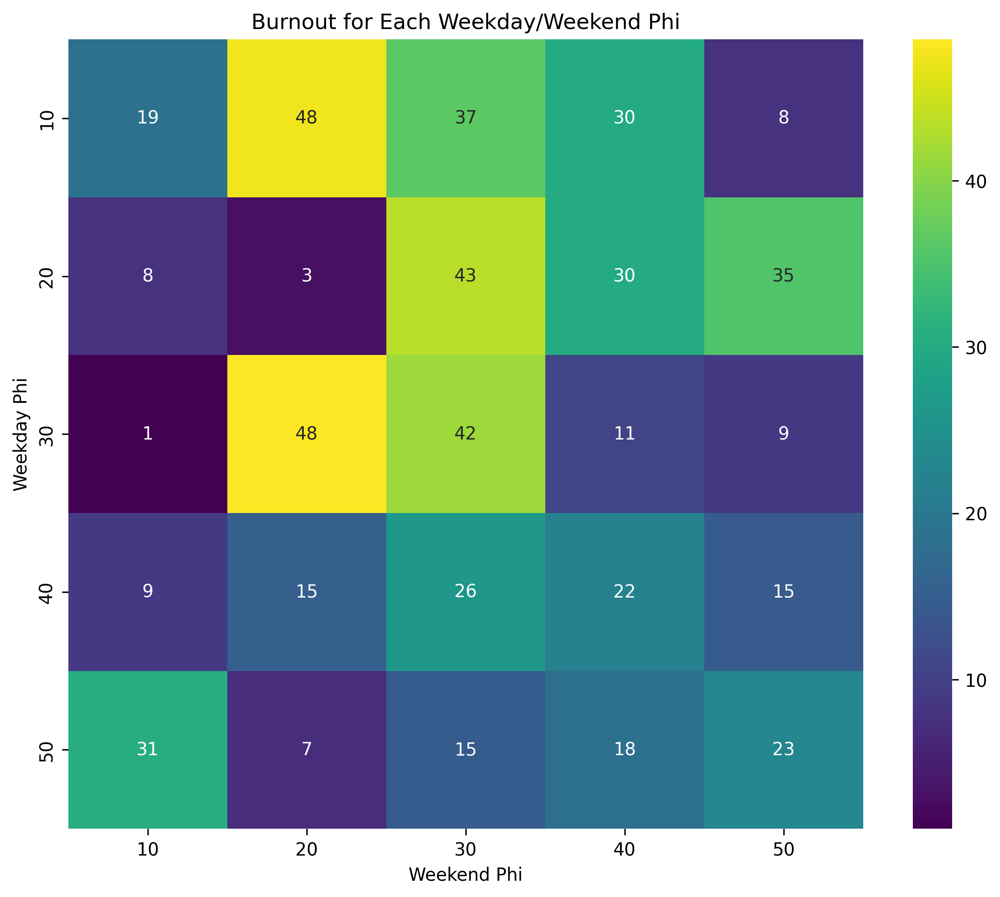

In [70]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define the values for weekday and weekend phi
weekday_phi = [10, 20, 30]
weekend_phi = [10, 20, 30]

# Create random data for the outcomes of each combination
np.random.seed(42)  # for reproducibility
data = np.random.rand(len(weekday_phi), len(weekend_phi)) * 50  # Random values scaled up to 100

# Create a heatmap
plt.figure(figsize=(10, 8), dpi = 300)
ax = sns.heatmap(data, annot=True, fmt=".0f", cmap="viridis", xticklabels=weekend_phi, yticklabels=weekday_phi)
ax.set_title('Burnout for Each Weekday/Weekend Phi')
ax.set_xlabel('Weekend Phi')
ax.set_ylabel('Weekday Phi')
plt.show()



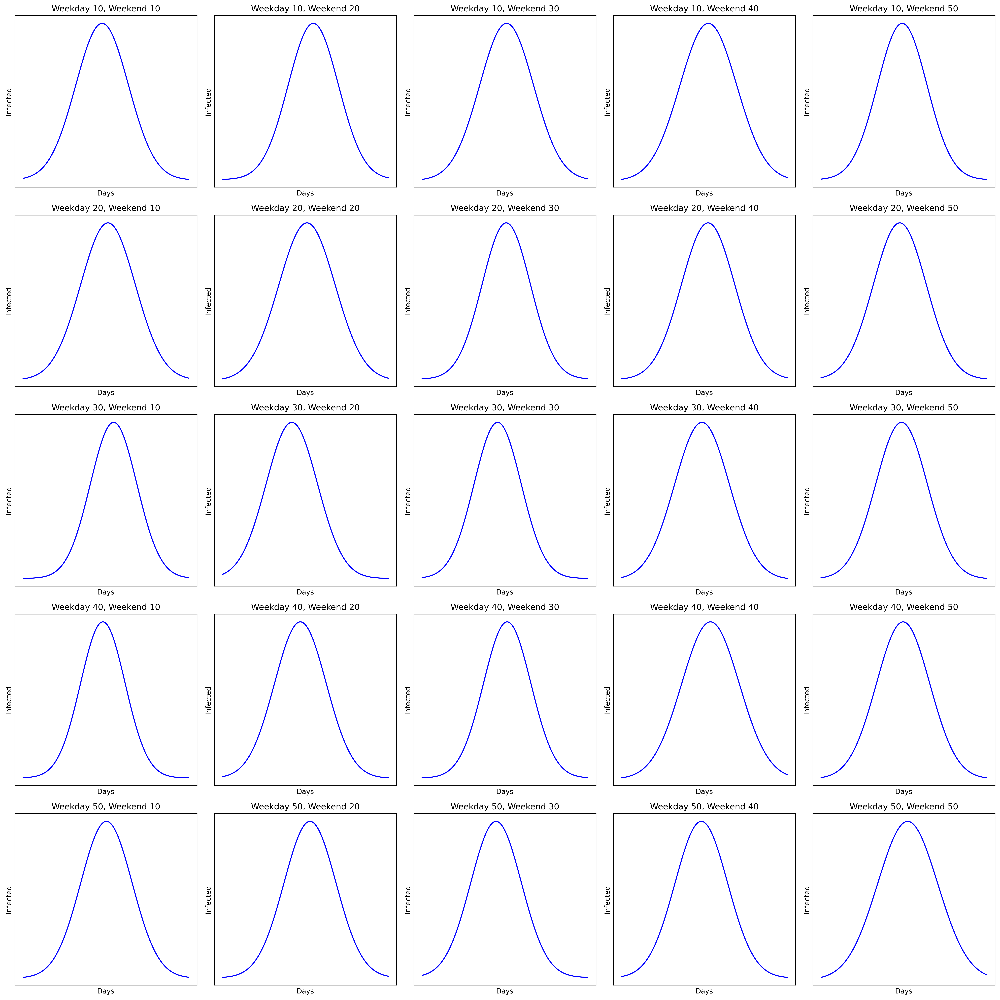

In [76]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.stats import norm

# Define the values for weekday and weekend phi
weekday_phi = [10, 20, 30, 40, 50]
weekend_phi = [10, 20, 30, 40, 50]
num_simulations = 50

# Create figure and gridspec
fig = plt.figure(figsize=(20, 20), dpi=300)
gs = GridSpec(5, 5, figure=fig)

# Generate data for each phi combination
simulation_data = [
    [np.random.normal(loc=wdp + wep, scale=np.sqrt(wdp * wep) / 10, size=1000) for wep in weekend_phi]
    for wdp in weekday_phi
]

# Plotting each combination
for i in range(5):
    for j in range(5):
        ax = fig.add_subplot(gs[i, j])
        data = simulation_data[i][j]
        mu, sigma = norm.fit(data)

        # Set the x range based on the minimum and maximum data observed
        x_range = np.linspace(data.min(), data.max(), 1000)
        pdf = norm.pdf(x_range, mu, sigma)

        # Plot PDF
        ax.plot(x_range, pdf, color='blue')
        ax.set_title(f'Weekday {weekday_phi[i]}, Weekend {weekend_phi[j]}')
        ax.set_xlabel('Days')
        ax.set_ylabel('Infected')
        
        # Remove ticks for clarity
        ax.set_xticks([])
        ax.set_yticks([])

# Adjust layout and display
plt.tight_layout()
plt.show()


In [66]:
weekday_phi = [10, 20, 30, 40, 50]
weekend_phi = [10, 20, 30, 40, 50]
for j in range(20):
    for i in range(20):
        sim = StandardSimulation(
            geo = geo_library['maricopa_cbg_2019'](),
            ipm=sirv_ipm,
            mm=mm_library['centroids'](),
            params={
                'beta_s': 1.6,
                'beta_v': 0.6,
                'alpha': 20, 
                'gamma': 10,
                'omega': 0.0000023,
                'sigma': 0.12,  
                'phi': 10,
                'weekday_phi': weekday_phi[i],
                'weekend_phi': weekend_phi[j]
            },
            time_frame=TimeFrame.of("2019-01-01", 1),
            initializer=partial(explicit, initials=initials_array)
        )

        with sim_messaging(sim):
            output = sim.run()
        
        out_file = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/{phi}_{i}_out.csv'
        save_csv(path=out_file, out = output )

Running simulation (StandardSimulation):
• 2019-01-01 to 2019-01-02 (1 days)
• 2494 geo nodes
|####################| 100% 
Runtime: 4.003s
Running simulation (StandardSimulation):
• 2019-01-01 to 2019-01-02 (1 days)
• 2494 geo nodes


KeyboardInterrupt: 

In [ ]:
out_file = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10_{i}_out.csv'
file_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10__0_out.csv'
communter = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10_0_communters_out.csv'
compartment_labels=['S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2']
event_labels=['S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

In [89]:
grouped_df = df.groupby('ticks')['I'].sum().reset_index()
grouped_df['ticks'] = grouped_df['ticks'].apply(lambda x: (x + 1) // 2)

grouped_df

,ticks,I
0,0,1
1,1,1
2,1,1
3,2,1
4,2,1
...,...,...
499,250,19
500,250,19
501,251,17
502,251,15


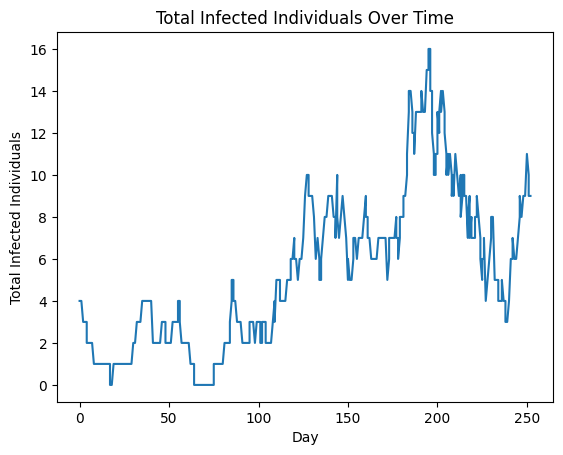

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
communter = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims/50_0_out.csv'
header_names = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
df = pd.read_csv(communter, header= None, skiprows = 1, names = header_names)

grouped_df = df.groupby('ticks')['I'].sum().reset_index()

grouped_df['ticks'] = grouped_df['ticks'].apply(lambda x: (x + 1) // 2)

plt.plot(grouped_df['ticks'], grouped_df['I'])
plt.xlabel('Day')
plt.ylabel('Total Infected Individuals')
plt.title('Total Infected Individuals Over Time')
plt.show()


In [69]:
file_path = single_simulation_out

header_names = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
plot_df = pd.read_csv(file_path, header= None, skiprows = 1, names = header_names)

Events = plot_df[['ticks', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']]
Events = Events.groupby(Events['ticks'] // 2, as_index=False).sum()
Events

,ticks,S → E,E → I,I → R,VS_1 → E,VS_1 → V_2,VR_1 → V_2
0,2494,0,0,0,0,0,0
1,12470,0,0,0,0,1,0
2,22446,0,0,1,0,0,0
3,32422,0,0,0,0,0,0
4,42398,0,0,0,0,0,0
...,...,...,...,...,...,...,...
247,2466566,0,0,0,0,0,0
248,2476542,0,0,0,0,0,0
249,2486518,0,0,0,0,1,0
250,2496494,0,0,0,0,0,0


In [70]:
compartment_df = pd.read_csv(file_path, header= None, skiprows = 1, names = header_names)

Events = plot_df[['ticks', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']]
Events = Events.groupby(Events['ticks'] // 7, as_index=False).sum()
Events

,ticks,S → E,E → I,I → R,VS_1 → E,VS_1 → V_2,VR_1 → V_2
0,52374,0,0,1,0,1,0
1,174580,0,0,0,0,2,0
2,296786,0,0,0,0,0,0
3,418992,0,0,0,0,0,0
4,541198,0,0,0,0,0,0
...,...,...,...,...,...,...,...
67,8240176,0,0,0,0,4,0
68,8362382,0,0,0,0,0,0
69,8484588,0,0,0,0,4,0
70,8606794,0,0,0,0,0,0


In [26]:
df_gravity_40

,ticks,geo_index,S,E,I,R,VR_1,VS_1,V,S → E,E → I,I → R,VS_1 → E,VS_1 → V_2,VR_1 → V_2
0,0,0,143,0,0,0,77,1524,0,0,0,0,0,0,0
1,0,1,160,0,0,0,91,1689,0,0,0,0,0,0,0
2,0,2,105,0,0,0,60,1069,0,0,0,0,0,0,0
3,0,3,87,0,0,0,56,989,0,0,0,0,0,0,0
4,0,4,118,0,0,0,64,1272,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256971,503,2489,159,0,0,0,90,1729,1,0,0,0,0,0,0
1256972,503,2490,67,0,0,0,39,728,0,0,0,0,0,0,0
1256973,503,2491,144,2,0,4,86,1629,0,0,0,0,0,0,0
1256974,503,2492,244,0,0,0,141,2664,0,0,0,0,0,0,0


In [108]:
[*range(15,16)]

[15]

In [7]:
df_wkdy_wknd

,ticks,geo_index,S,E,I,R,VR_1,VS_1,V,S → E,E → I,I → R,VS_1 → E,VS_1 → V_2,VR_1 → V_2
0,0,0,137,0,0,0,81,1452,0,0,0,0,0,0,0
1,0,1,151,0,0,0,86,1626,0,0,0,0,0,0,0
2,0,2,99,0,0,0,52,1061,0,0,0,0,0,0,0
3,0,3,88,0,0,0,48,926,0,0,0,0,0,0,0
4,0,4,110,0,0,0,71,1223,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256971,503,2489,159,0,0,0,91,1729,0,0,0,0,0,0,0
1256972,503,2490,67,0,0,0,39,728,0,0,0,0,0,0,0
1256973,503,2491,150,0,0,0,86,1629,0,0,0,0,0,0,0
1256974,503,2492,244,0,0,0,141,2664,0,0,0,0,0,0,0


In [2]:
import pandas as pd

gravity_base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims/'
communter_base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'

dataframe_gravity_10 = pd.DataFrame()
dataframe_gravity_20 = pd.DataFrame()
dataframe_gravity_30 = pd.DataFrame()
dataframe_gravity_40 = pd.DataFrame()
dataframe_gravity_50 = pd.DataFrame()

dataframe_commuter = pd.DataFrame()

csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0 

for i in range(20):
    gravity_10_file_path = f'{gravity_base_path}10_{i}_out.csv'
    gravity_20_file_path = f'{gravity_base_path}20_{i}_out.csv'
    gravity_30_file_path = f'{gravity_base_path}30_{i}_out.csv'
    gravity_40_file_path = f'{gravity_base_path}40_{i}_out.csv'
    gravity_50_file_path = f'{gravity_base_path}50_{i}_out.csv'

    commuter_file_path = f'{communter_base_path}10_{i}_communters_out.csv'

    df_gravity_10 = pd.read_csv(gravity_10_file_path, skiprows=1, names=csv_header)
    df_gravity_20 = pd.read_csv(gravity_20_file_path, skiprows=1, names=csv_header)
    df_gravity_30 = pd.read_csv(gravity_30_file_path, skiprows=1, names=csv_header)
    df_gravity_40 = pd.read_csv(gravity_40_file_path, skiprows=1, names=csv_header)
    df_gravity_50 = pd.read_csv(gravity_50_file_path, skiprows=1, names=csv_header)

    df_commuter = pd.read_csv(commuter_file_path, skiprows=1, names=csv_header)

    MEASLES_IPM_grouped_10 = df_gravity_10.groupby('ticks')[['I', 'E']].sum().reset_index()
    MEASLES_IPM_grouped_20 = df_gravity_20.groupby('ticks')[['I', 'E']].sum().reset_index()
    MEASLES_IPM_grouped_30 = df_gravity_30.groupby('ticks')[['I', 'E']].sum().reset_index()
    MEASLES_IPM_grouped_40 = df_gravity_40.groupby('ticks')[['I', 'E']].sum().reset_index()
    MEASLES_IPM_grouped_50 = df_gravity_50.groupby('ticks')[['I', 'E']].sum().reset_index()
    
    MEASLES_IPM_grouped_commuter = df_commuter.groupby('ticks')['I'].sum().reset_index()

    
    MEASLES_IPM_grouped_10['ticks'] = MEASLES_IPM_grouped_10['ticks'].apply(lambda x: (x + 1) // 2)
    MEASLES_IPM_grouped_20['ticks'] = MEASLES_IPM_grouped_20['ticks'].apply(lambda x: (x + 1) // 2)
    MEASLES_IPM_grouped_30['ticks'] = MEASLES_IPM_grouped_30['ticks'].apply(lambda x: (x + 1) // 2)
    MEASLES_IPM_grouped_40['ticks'] = MEASLES_IPM_grouped_40['ticks'].apply(lambda x: (x + 1) // 2)
    MEASLES_IPM_grouped_50['ticks'] = MEASLES_IPM_grouped_50['ticks'].apply(lambda x: (x + 1) // 2)

    MEASLES_IPM_grouped_commuter['ticks'] = MEASLES_IPM_grouped_commuter['ticks'].apply(lambda x: (x + 1) // 3)

    if MEASLES_IPM_grouped_10.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped_10.shape[0]
    if MEASLES_IPM_grouped_20.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped_20.shape[0]
    if MEASLES_IPM_grouped_30.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped_30.shape[0]
    if MEASLES_IPM_grouped_40.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped_40.shape[0]
    if MEASLES_IPM_grouped_50.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped_50.shape[0]
    if MEASLES_IPM_grouped_commuter.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped_commuter.shape[0]
    
    dataframe_gravity_10[f'Sim_{i+1}'] = MEASLES_IPM_grouped_10['I'].reindex(range(max_days)).values
    dataframe_gravity_20[f'Sim_{i+1}'] = MEASLES_IPM_grouped_20['I'].reindex(range(max_days)).values
    dataframe_gravity_30[f'Sim_{i+1}'] = MEASLES_IPM_grouped_30['I'].reindex(range(max_days)).values
    dataframe_gravity_40[f'Sim_{i+1}'] = MEASLES_IPM_grouped_40['I'].reindex(range(max_days)).values
    dataframe_gravity_50[f'Sim_{i+1}'] = MEASLES_IPM_grouped_50['I'].reindex(range(max_days)).values
    dataframe_commuter[f'Sim_{i+1}'] = MEASLES_IPM_grouped_commuter['I'].reindex(range(max_days)).values

dataframe_gravity_10.index = (dataframe_gravity_10.index + 1) // 2
dataframe_gravity_20.index = (dataframe_gravity_20.index + 1) // 2
dataframe_gravity_30.index = (dataframe_gravity_30.index + 1) // 2
dataframe_gravity_40.index = (dataframe_gravity_40.index + 1) // 2
dataframe_gravity_50.index = (dataframe_gravity_50.index + 1) // 2

dataframe_commuter.index = (dataframe_commuter.index + 1) // 3


dataframe_commuter


,Sim_1,Sim_2,Sim_3,Sim_4,Sim_5,Sim_6,Sim_7,Sim_8,Sim_9,Sim_10,Sim_11,Sim_12,Sim_13,Sim_14,Sim_15,Sim_16,Sim_17,Sim_18,Sim_19,Sim_20
0,4,4,4,3,4,4,4,3,4,4,3,4,3,4,4,3,4,3,4,4
0,4,4,4,3,4,4,4,3,4,4,3,4,3,4,4,3,4,2,3,4
1,4,4,4,3,4,3,4,3,4,4,3,4,3,4,4,3,4,1,3,4
1,3,4,4,3,4,3,4,3,4,4,2,4,3,4,4,3,4,1,3,4
1,3,4,4,3,4,3,4,3,4,4,2,5,3,4,4,3,4,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,30,113,40,103,23,130,61,79,463,106,210,59,160,139,282,45,156,152,0,139
251,30,115,42,110,22,123,59,81,459,108,210,59,161,142,292,46,153,154,0,142
251,33,115,42,113,22,126,60,82,460,108,205,61,158,142,295,48,156,153,0,142
251,33,117,41,114,23,127,58,84,470,107,202,63,163,142,298,51,157,153,0,142


In [57]:
dataframe_gravity_40.dropna()

,Sim_1,Sim_2,Sim_3,Sim_4,Sim_5,Sim_6,Sim_7,Sim_8,Sim_9,Sim_10,Sim_11,Sim_12,Sim_13,Sim_14,Sim_15,Sim_16,Sim_17,Sim_18,Sim_19,Sim_20
0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0
1,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0
1,3.0,3.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0
2,3.0,3.0,4.0,4.0,3.0,3.0,2.0,4.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,3.0,4.0,2.0,4.0,4.0
2,3.0,3.0,4.0,4.0,3.0,3.0,2.0,4.0,4.0,3.0,4.0,2.0,3.0,3.0,4.0,3.0,4.0,2.0,3.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,43.0,32.0,25.0,4.0,0.0,5.0,0.0,10.0,44.0,39.0,16.0,15.0,67.0,0.0,13.0,11.0,11.0,0.0,0.0,9.0
250,46.0,32.0,26.0,3.0,0.0,4.0,0.0,8.0,46.0,38.0,15.0,17.0,61.0,0.0,12.0,10.0,11.0,0.0,0.0,9.0
251,45.0,32.0,24.0,3.0,0.0,5.0,0.0,6.0,42.0,41.0,14.0,14.0,62.0,0.0,11.0,10.0,10.0,0.0,0.0,9.0
251,47.0,32.0,21.0,3.0,0.0,7.0,0.0,6.0,44.0,41.0,14.0,14.0,63.0,0.0,11.0,10.0,10.0,0.0,0.0,10.0


In [56]:
dataframe_gravity_50.dropna()

,Sim_1,Sim_2,Sim_3,Sim_4,Sim_5,Sim_6,Sim_7,Sim_8,Sim_9,Sim_10,Sim_11,Sim_12,Sim_13,Sim_14,Sim_15,Sim_16,Sim_17,Sim_18,Sim_19,Sim_20
0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0
1,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0
1,4.0,4.0,4.0,4.0,3.0,4.0,2.0,4.0,4.0,3.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0
2,3.0,4.0,3.0,4.0,3.0,4.0,2.0,3.0,4.0,3.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0
2,3.0,4.0,3.0,4.0,3.0,4.0,2.0,3.0,4.0,3.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,2.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,11.0,36.0,5.0,18.0,43.0,67.0,5.0,8.0,37.0,21.0,35.0,59.0,18.0,15.0,8.0,3.0,31.0,43.0,4.0,5.0
250,11.0,36.0,5.0,18.0,45.0,67.0,5.0,8.0,37.0,21.0,35.0,56.0,17.0,15.0,7.0,3.0,30.0,45.0,4.0,5.0
251,10.0,37.0,5.0,19.0,45.0,70.0,4.0,8.0,34.0,23.0,32.0,56.0,19.0,15.0,7.0,3.0,33.0,43.0,4.0,6.0
251,9.0,37.0,5.0,18.0,46.0,71.0,4.0,9.0,34.0,21.0,35.0,57.0,18.0,16.0,8.0,3.0,30.0,44.0,4.0,7.0


In [1]:
import pandas as pd

# Paths
gravity_base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims/'
commuter_base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'

# Column headers
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

# Initialize DataFrame for each scenario
dataframes = {key: pd.DataFrame() for key in range(10, 60, 10)}

max_days = 0

for i in range(20):
    # Read and group each file
    for key in dataframes:
        file_path = f'{gravity_base_path}{key}_{i}_out.csv'
        df = pd.read_csv(file_path, skiprows=1, names=csv_header)
        grouped = df.groupby('ticks')[['I', 'E']].sum().reset_index()
        grouped['ticks'] = grouped['ticks'].apply(lambda x: (x + 1) // 2)  # Adjust ticks
        max_days = max(max_days, grouped.shape[0])
        dataframes[key][f'Sim_{i+1}'] = grouped[['I', 'E']].reindex(range(max_days)).values.tolist()  # Store as list of lists

# Commuter data processing    commuter_file_path = f'{communter_base_path}10_{i}_communters_out.csv'
dataframe_commuter = pd.DataFrame()
for i in range(20):
    commuter_file_path = f'{commuter_base_path}10_{i}_communters_out.csv'
    df_commuter = pd.read_csv(commuter_file_path, skiprows=1, names=csv_header)
    grouped_commuter = df_commuter.groupby('ticks')['I'].sum().reset_index()
    grouped_commuter['ticks'] = grouped_commuter['ticks'].apply(lambda x: (x + 1) // 3)
    max_days = max(max_days, grouped_commuter.shape[0])
    dataframe_commuter[f'Sim_{i+1}'] = grouped_commuter['I'].reindex(range(max_days)).fillna(0).tolist()  # Handle missing values

# Adjust index for presentation
for df in dataframes.values():
    df.index = (df.index + 1) // 2

dataframe_commuter.index = (dataframe_commuter.index + 1) // 3

dataframe_commuter

/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_79810/537224429.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

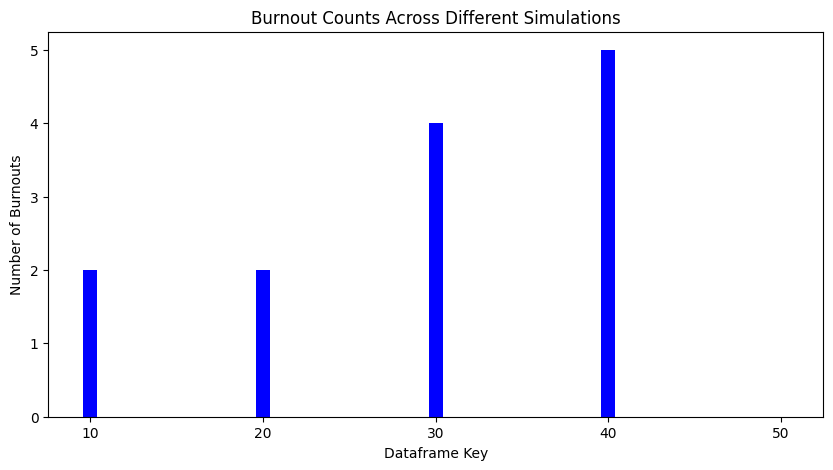

In [59]:
burnout_counts = []

# Counting burnouts for each key
for key, df in dataframes.items():
    count = 0
    total_sims = len(df.columns)
    for sim in df.columns:
        if df[sim].iloc[-1] == [0, 0]:
            count += 1
    burnout_counts.append(count)

keys = list(dataframes.keys())
plt.figure(figsize=(10, 5))
plt.bar(keys, burnout_counts, color='blue')
plt.xlabel('Dataframe Key')
plt.ylabel('Number of Burnouts')
plt.title('Burnout Counts Across Different Simulations')
plt.xticks(keys)
plt.show()

In [18]:
base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Weekend_and_weekday/'
dataframe_wkdy_wknd = pd.DataFrame()

csv_header = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0

# Adjust the range to exclude simulations 2, 3, 19, and 20
excluded_sims = [101]
for i in [x for x in range(80) if x not in excluded_sims]:
    file_path = f'{base_path}movement_{i}_out.csv'
    
    df = pd.read_csv(file_path, header=None, skiprows=1, names=csv_header)
    grouped_df = df.groupby('ticks')['I'].sum().reset_index()
    grouped_df['ticks'] = grouped_df['ticks'].apply(lambda x: (x + 1) // 2)
    
    if grouped_df.shape[0] > max_days:
        max_days = grouped_df.shape[0]
    
    dataframe_wkdy_wknd[f'Sim_{i}'] = grouped_df['I'].reindex(range(max_days)).values

dataframe_wkdy_wknd.index = (dataframe_wkdy_wknd.index + 1) // 2

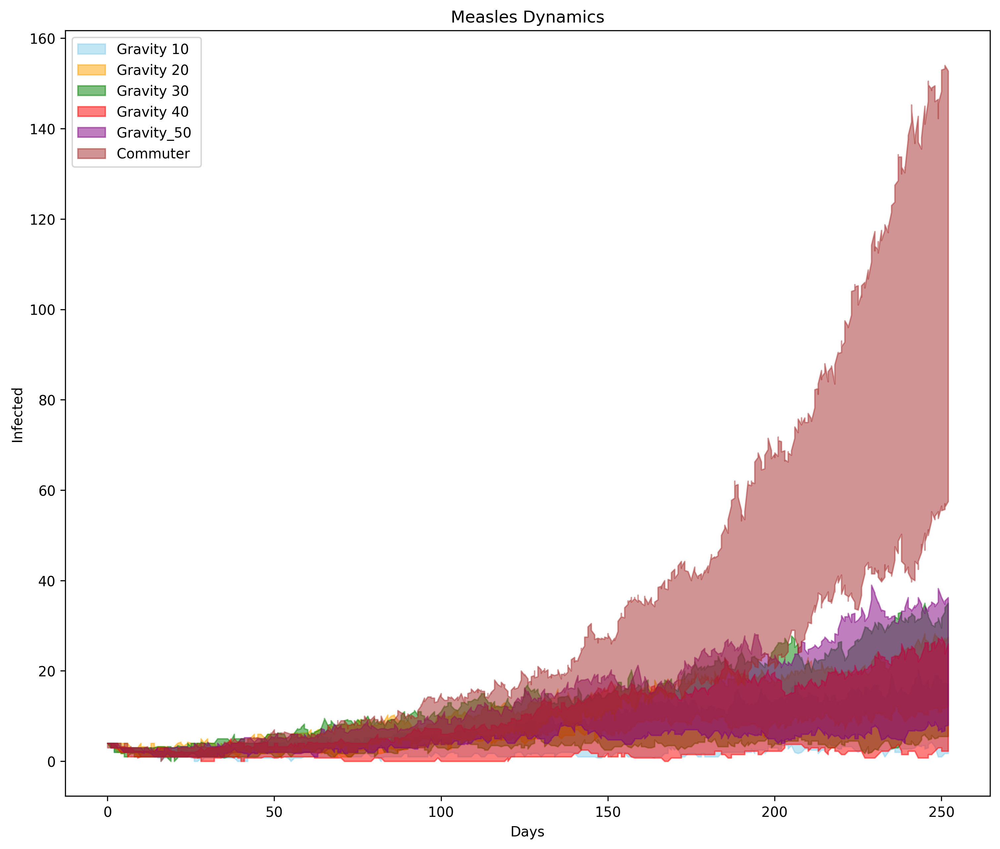

In [13]:

dataframes = [dataframe_gravity_10, dataframe_gravity_20, dataframe_gravity_30, dataframe_gravity_40, dataframe_gravity_50, dataframe_commuter,]
dataframe_names = ['Gravity 10', 'Gravity 20', 'Gravity 30', 'Gravity 40', 'Gravity_50', 'Commuter', ]

# Defining colors for each DataFrame
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'brown', 'grey']

plt.figure(figsize=(12, 10), dpi = 300)

for dataframe, name, color in zip(dataframes, dataframe_names, colors):
    quartile_25 = dataframe.quantile(0.25, axis=1).values
    quartile_75 = dataframe.quantile(0.75, axis=1).values
 
    
    plt.fill_between(dataframe.index, quartile_25, quartile_75, color=color, alpha=0.5, label=f'{name} ')

plt.xlabel('Days')
plt.ylabel('Infected')
plt.title('Measles Dynamics')
plt.legend(loc='upper left')
plt.show()


MovieWriter imagemagick unavailable; using Pillow instead.


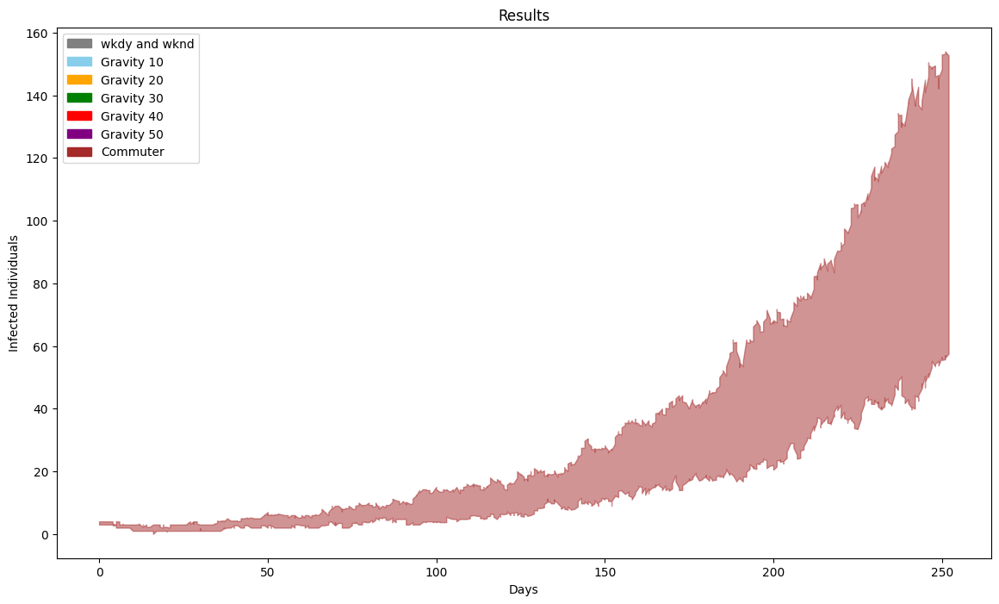

In [24]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Patch

# Assuming dataframes and their setup are already defined
dataframes = [dataframe_wkdy_wknd, dataframe_gravity_10, dataframe_gravity_20, dataframe_gravity_30, dataframe_gravity_40, dataframe_gravity_50, dataframe_commuter, ]
dataframe_names = ['wkdy and wknd','Gravity 10', 'Gravity 20', 'Gravity 30', 'Gravity 40', 'Gravity 50', 'Commuter']
colors = ['grey','skyblue', 'orange', 'green', 'red', 'purple', 'brown']

fig, ax = plt.subplots(figsize=(14, 8))

legend_patches = [Patch(color=color, label=name) for color, name in zip(colors, dataframe_names)]

def init():
    ax.set_xlabel('Days')
    ax.set_ylabel('Infected Individuals')
    ax.set_title('Results')
    ax.legend(handles=legend_patches, loc='upper left')

def animate(i):
    ax.clear()
    init()  # Initialize plot each time to keep labels and title
    dataframe = dataframes[i]
    name = dataframe_names[i]
    color = colors[i]

    quartile_25 = dataframe.quantile(0.25, axis=1)
    quartile_75 = dataframe.quantile(0.75, axis=1)

    ax.fill_between(dataframe.index, quartile_25, quartile_75, color=color, alpha=0.5, label=f'{name} 25th-75th percentile')

ani = animation.FuncAnimation(fig, animate, frames=len(dataframes), init_func=init, repeat=False)

ani.save('dataframe_spread.gif', writer='imagemagick', fps=1)



MovieWriter imagemagick unavailable; using Pillow instead.


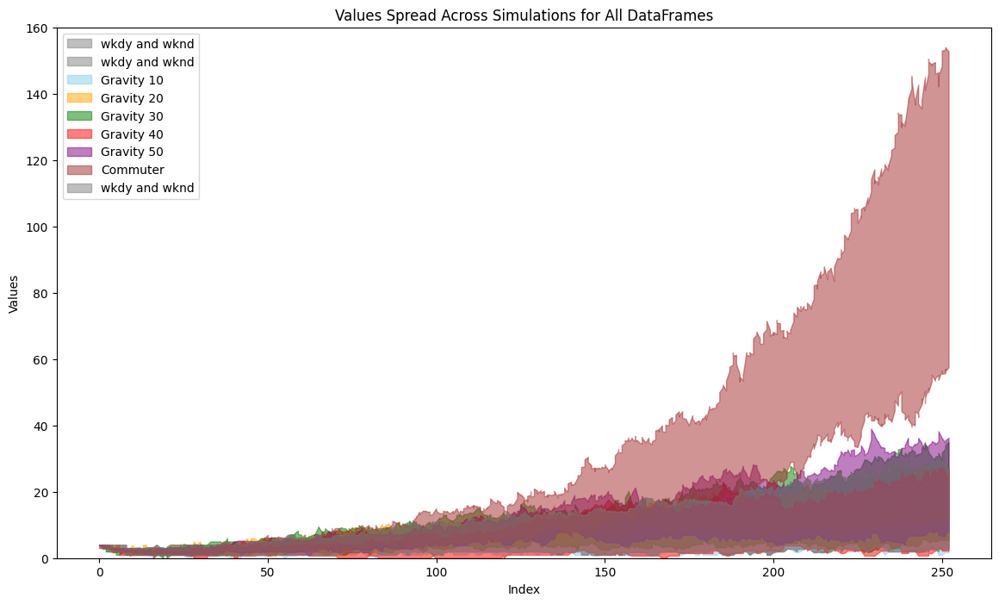

In [25]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation



fig, ax = plt.subplots(figsize=(14, 8))
ax.set_xlabel('Index')
ax.set_ylabel('Values')
ax.set_title('Values Spread Across Simulations for All DataFrames')
ax.set_ylim(0, 160)  

def animate(i):
    dataframe = dataframes[i]
    color = colors[i]
    name = dataframe_names[i]
    quartile_25 = dataframe.quantile(0.25, axis=1).values
    quartile_75 = dataframe.quantile(0.75, axis=1).values
    ax.fill_between(dataframe.index, quartile_25, quartile_75, color=color, alpha=0.5, label=name)
    ax.legend(loc='upper left')

anim = FuncAnimation(fig, animate, frames=len(dataframes), interval=1000, repeat=False)

anim.save('dataframes_animation.gif', writer='imagemagick', fps=1)

MovieWriter imagemagick unavailable; using Pillow instead.


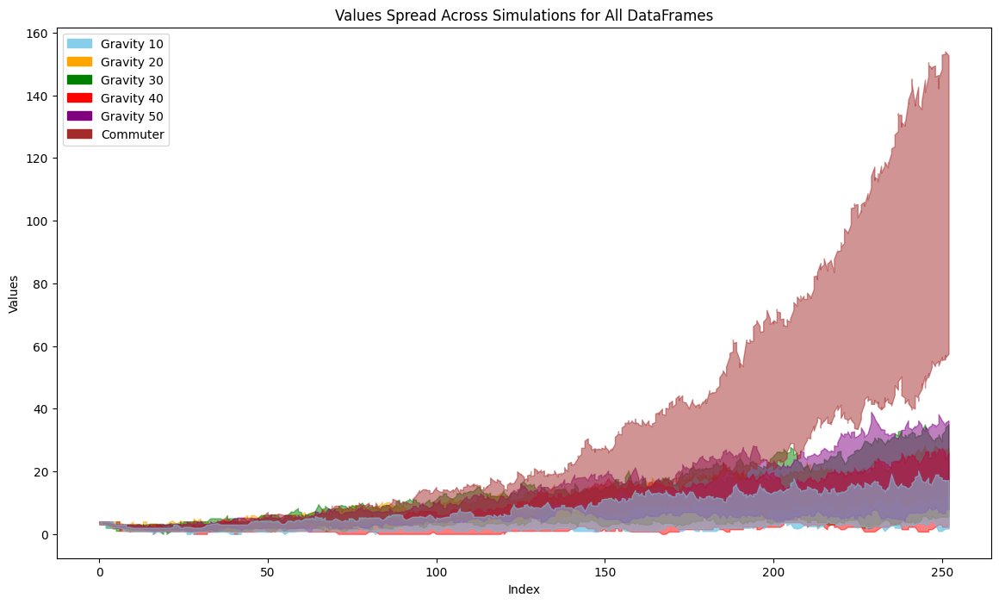

In [127]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Patch

# Setup
dataframes = [dataframe_gravity_10, dataframe_gravity_20, dataframe_gravity_30, dataframe_gravity_40, dataframe_gravity_50, dataframe_commuter]
dataframe_names = ['Gravity 10', 'Gravity 20', 'Gravity 30', 'Gravity 40', 'Gravity 50', 'Commuter']
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'brown']

fig, ax = plt.subplots(figsize=(14, 8))

# Initialize plot
ax.set_xlabel('Index')
ax.set_ylabel('Values')
ax.set_title('Values Spread Across Simulations for All DataFrames')
legend_patches = [Patch(color=color, label=name) for color, name in zip(colors, dataframe_names)]
ax.legend(handles=legend_patches, loc='upper left')

def animate(i):
    # Do not clear the axes
    dataframe = dataframes[i]
    color = colors[i]

    quartile_25 = dataframe.quantile(0.25, axis=1)
    quartile_75 = dataframe.quantile(0.75, axis=1)

    ax.fill_between(dataframe.index, quartile_25, quartile_75, color=color, alpha=0.5)

ani = animation.FuncAnimation(fig, animate, frames=len(dataframes), repeat=False)

# Save the animation
ani.save('cumulative_dataframes.gif', writer='imagemagick', fps=1)

# To display the animation in a Jupyter notebook, you can use:
# from IPython.display import HTML
# HTML(ani.to_jshtml())



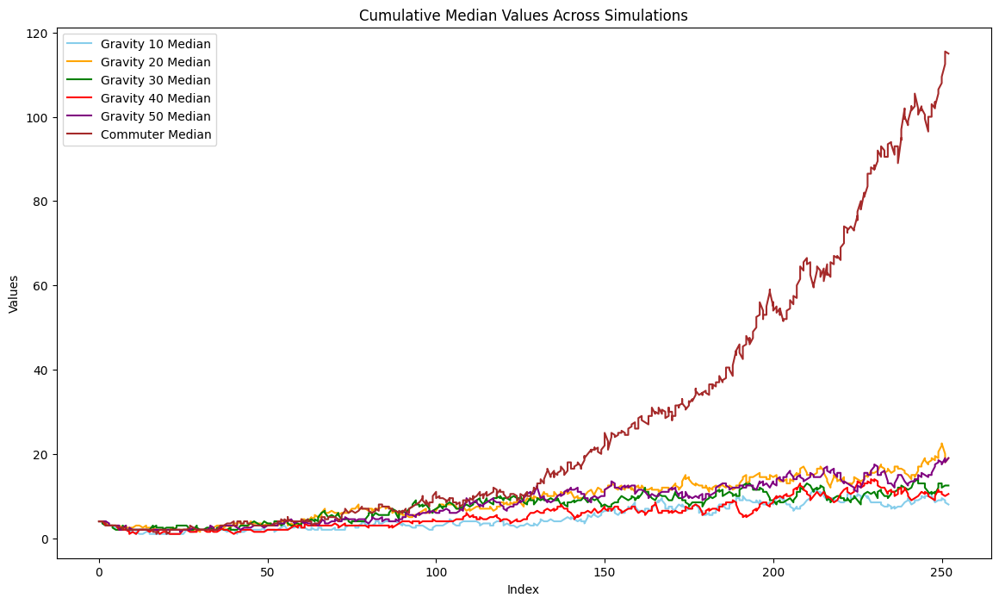

In [130]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Prepare the figure and axes
fig, ax = plt.subplots(figsize=(14, 8))
lines = []  # To keep track of lines for legend
labels = []  # To keep track of labels for legend

def init():
    ax.set_xlabel('Index')
    ax.set_ylabel('Values')
    ax.set_title('Cumulative Median Values Across Simulations')

def update(frame_number):
    dataframe = dataframes[frame_number]
    name = dataframe_names[frame_number]
    color = colors[frame_number]

    median_values = dataframe.median(axis=1)
    # Plot and keep track of the line and label
    line, = ax.plot(dataframe.index, median_values, color=color, label=f'{name} Median')
    lines.append(line)
    labels.append(f'{name} Median')

    # Update the legend in each frame
    ax.legend(lines, labels, loc='upper left')

# Initialize the animation
ani = animation.FuncAnimation(fig, update, frames=range(len(dataframes)), init_func=init, blit=False, repeat=False)

# To display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

# Optionally, save the animation
# ani.save('cumulative_median_values.gif', writer='imagemagick', fps=1)



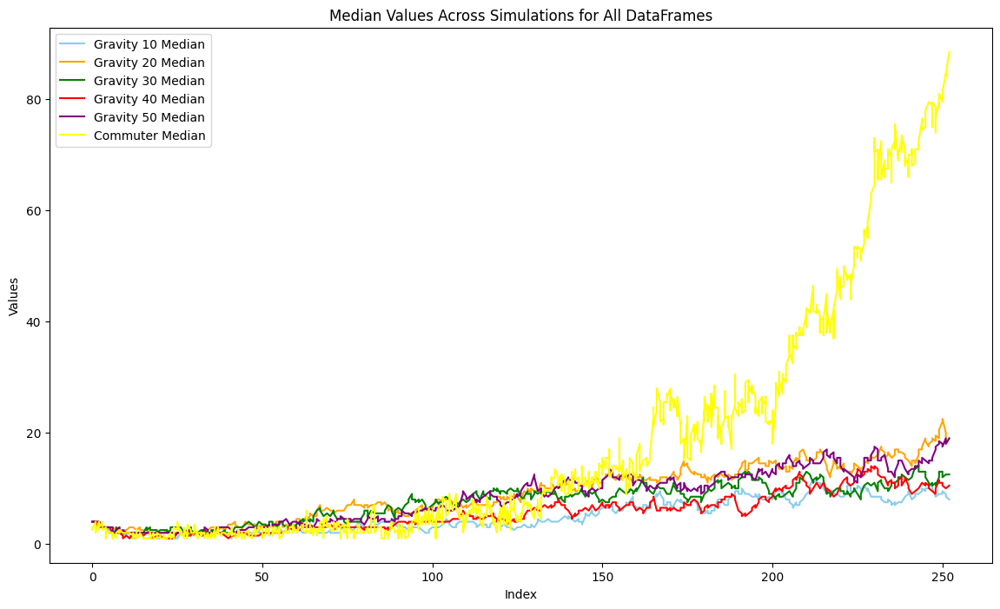

In [102]:
import matplotlib.pyplot as plt

# Assuming your DataFrames are correctly defined and imported
dataframes = [dataframe_gravity_10, dataframe_gravity_20, dataframe_gravity_30, dataframe_gravity_40, dataframe_gravity_50, dataframe_commuter]
dataframe_names = ['Gravity 10', 'Gravity 20', 'Gravity 30', 'Gravity 40', 'Gravity 50', 'Commuter']

# Defining colors for each DataFrame
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'yellow']

plt.figure(figsize=(14, 8))

for dataframe, name, color in zip(dataframes, dataframe_names, colors):
    median_values = dataframe.median(axis=1).values
    plt.plot(dataframe.index, median_values, color=color, label=f'{name} Median')

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Median Values Across Simulations for All DataFrames')
plt.legend(loc='upper left')
plt.show()


In [15]:
import pandas as pd

# Base paths for the CSV files
gravity_base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims/'
commuter_base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/'

# Initial empty DataFrame to hold aggregated data
dataframe = pd.DataFrame()
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0

# Loop through the range of simulations
for i in range(20):
    infections_sum = None  # Reset sum of infections for each simulation
    
    # Iterate through different gravity simulation conditions
    for gravity_strength in [10, 20, 30, 40, 50]:
        file_path = f'{gravity_base_path}{gravity_strength}_{i}_out.csv'
        
        try:
            # Read the CSV file and skip the header
            df = pd.read_csv(file_path, skiprows=1, names=csv_header)
            
            # Aggregate the 'I' column by 'ticks', summing up infections
            infections = df.groupby('ticks')['I'].sum()
            
            # If infections_sum is None, initialize it. Otherwise, add the current infections.
            infections_sum = infections if infections_sum is None else infections_sum.add(infections, fill_value=0)
            
        except FileNotFoundError:
            print(f"File not found: {file_path}")
            continue

    # Read and process the commuter file
    commuter_file_path = f'{commuter_base_path}10_{i}_commuters_out.csv'
    try:
        df_commuter = pd.read_csv(commuter_file_path, skiprows=1, names=csv_header)
        infections_commuter = df_commuter.groupby('ticks')['I'].sum()
        infections_sum = infections_sum.add(infections_commuter, fill_value=0)
    except FileNotFoundError:
        print(f"File not found: {commuter_file_path}")

    # Update the maximum number of days if necessary
    max_days = max(max_days, infections_sum.index.max())
    
    # Append the aggregated infections to the dataframe
    dataframe[f'Sim_{i+1}'] = infections_sum.reindex(range(1, max_days+1), fill_value=0).values

# Adjust the dataframe index to reflect the simulation days accurately
dataframe.index = range(1, max_days+1)

print(dataframe)


File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/10_0_commuters_out.csv
File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/10_1_commuters_out.csv
File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/10_2_commuters_out.csv
File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/10_3_commuters_out.csv
File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/10_4_commuters_out.csv
File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/10_5_commuters_out.csv
File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Commuter_matrix/10_6_commuters_out.csv
File not found: /Users/alexandernez/Desktop/Github/Epymorph_vignettes

In [30]:
test

<bound method GroupBy.sum of <pandas.core.groupby.generic.DataFrameGroupBy object at 0x177fbf950>>

In [ ]:

for i in range(20):
    file_path = f'{base_path}30_{i}_out.csv'
    
    df = pd.read_csv(file_path, skiprows=1, names=csv_header)
    
    MEASLES_IPM = df[['ticks', 'I']]
    
    MEASLES_IPM_grouped = MEASLES_IPM.groupby(MEASLES_IPM['ticks']   , as_index=False).sum()
    
    if MEASLES_IPM_grouped.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped.shape[0]
    
    dataframe[f'Sim_{i+1}'] = MEASLES_IPM_grouped['I'].reindex(range(max_days)).values

dataframe.index = range(max_days)

/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_7179/2333074311.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


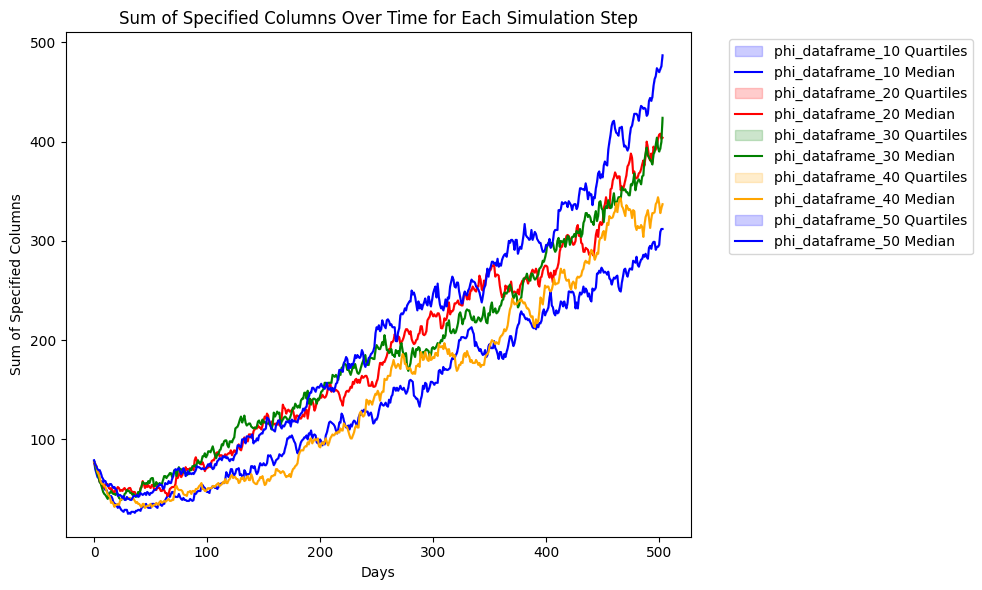

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims/'
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
simulation_steps = [10, 20, 30, 40, 50] 
i_range = range(1, 20)  

phi_dataframes = {}

for simulation_step in simulation_steps:
    aggregated_data = []  

    for i in range(20):
        file_path = f'{base_path}{simulation_step}_{i}_out.csv'
        df = pd.read_csv(file_path, skiprows=1, names=csv_header)
        
        MEASLES_IPM = df[['ticks', 'I']]
        
        aggregated_data.append(MEASLES_IPM)
    
    all_data = pd.concat(aggregated_data)
    
    grouped_data = all_data.groupby('ticks', as_index=False)['I'].sum()
    
    phi_dataframes[f'phi_dataframe_{simulation_step}'] = grouped_data

plt.figure(figsize=(10, 6))

colors = ['blue', 'red', 'green', 'orange']  
color_index = 0

for key, df in phi_dataframes.items():
    x_values = df['ticks']
    
    grouped = df.groupby('ticks')['I'].agg(['quantile', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]).rename(columns={'quantile': 'median', '<lambda_0>': 'first_quartile', '<lambda_1>': 'third_quartile'})
    
    plt.fill_between(grouped.index, grouped['first_quartile'], grouped['third_quartile'], color=colors[color_index], alpha=0.2, label=f'{key} Quartiles')
    plt.plot(grouped.index, grouped['median'], label=f'{key} Median', color=colors[color_index], linestyle='-')
    
    color_index = (color_index + 1) % len(colors)  #

plt.xlabel('Days')
plt.ylabel('Sum of Specified Columns')
plt.title('Sum of Specified Columns Over Time for Each Simulation Step')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims/'
csv_header = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
simulation_steps = [10, 20, 30, 40, 50]
excluded_sims = [2, 3, 19, 20]  # Adjusted based on your description to match index from 1

phi_dataframes = {}

for simulation_step in simulation_steps:
    aggregated_data = pd.DataFrame()

    for i in [x for x in range(1, 21) if x not in excluded_sims]:
        file_path = f'{base_path}{simulation_step}_{i}_out.csv'
        df = pd.read_csv(file_path, skiprows=1, names=csv_header)
        
        # Adjust 'ticks' for each simulation step (dividing by 3 and ceiling)
        df['ticks'] = df['ticks'].apply(lambda x: np.ceil(x / 3).astype(int))
        
        # Aggregating 'I' column data across simulations
        aggregated_df = df.groupby('ticks')['I'].sum().reset_index()
        
        # Preparing the DataFrame to capture all simulation data
        if aggregated_data.empty:
            aggregated_data = aggregated_df.set_index('ticks')
        else:
            # Summing up 'I' values across different simulation steps
            aggregated_data = pd.merge(aggregated_data, aggregated_df.set_index('ticks'), on='ticks', how='outer', suffixes=('', f'_sim_{i}'))
    
    # Filling NaN values that might occur due to the merge operation
    aggregated_data.fillna(0, inplace=True)
    
    # Summing across columns to get total 'I' values per tick across all simulations
    aggregated_data['Total_I'] = aggregated_data.sum(axis=1)
    
    # Resetting index to adjust 'ticks' back to a sequential order without gaps
    aggregated_data.reset_index(inplace=True)
    
    # Storing the aggregated data DataFrame for each simulation step
    phi_dataframes[f'phi_dataframe_{simulation_step}'] = aggregated_data[['ticks', 'Total_I']]

# Now phi_dataframes contains a DataFrame for each simulation step with aggregated 'I' values


In [4]:
phi_dataframes

{'phi_dataframe_10':      ticks  Total_I
 0        0       63
 1        1      162
 2        2      147
 3        3      139
 4        4      117
 ..     ...      ...
 164    164      639
 165    165      656
 166    166      681
 167    167      696
 168    168      484
 
 [169 rows x 2 columns],
 'phi_dataframe_20':      ticks  Total_I
 0        0       61
 1        1      171
 2        2      144
 3        3      129
 4        4      136
 ..     ...      ...
 164    164      896
 165    165      913
 166    166      935
 167    167      966
 168    168      641
 
 [169 rows x 2 columns],
 'phi_dataframe_30':      ticks  Total_I
 0        0       62
 1        1      166
 2        2      137
 3        3      108
 4        4       95
 ..     ...      ...
 164    164      786
 165    165      798
 166    166      856
 167    167      837
 168    168      573
 
 [169 rows x 2 columns],
 'phi_dataframe_40':      ticks  Total_I
 0        0       61
 1        1      170
 2        2      145

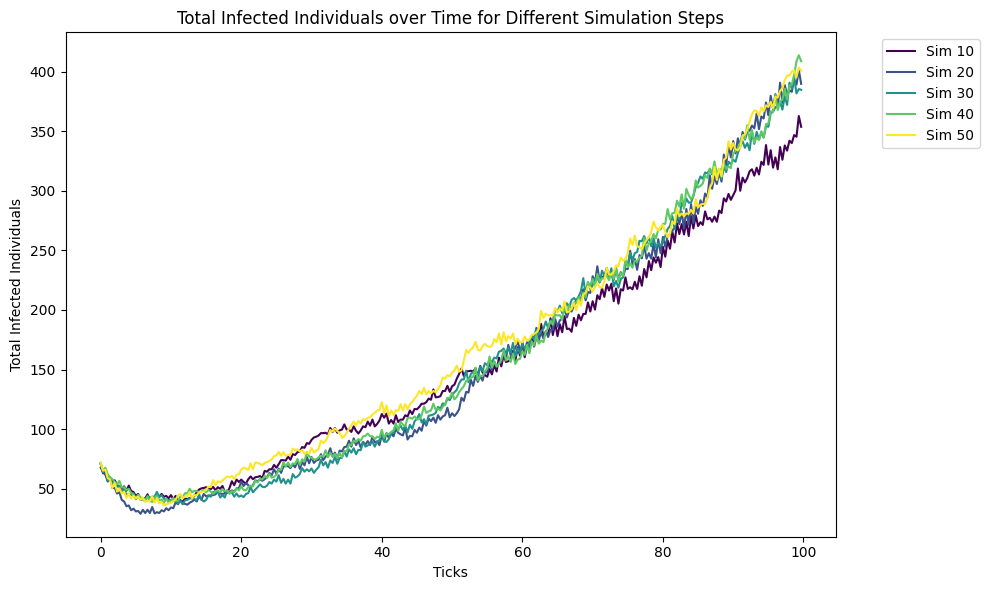

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
simulation_steps = [10, 20, 30, 40, 50] 
i_range = range(1, 20)  
start_index = 2  
step = 2  

phi_dataframes = {}

for simulation_step in simulation_steps:
    aggregated_data = []  

    for i in i_range:
        file_path = f'{base_path}{simulation_step}_{i}_out.csv'
        df = pd.read_csv(file_path, skiprows=1, names=csv_header)
        
        MEASLES_IPM = df[['ticks', 'I']]
        
        filtered_MEASLES_IPM = MEASLES_IPM.iloc[start_index::step]
        
        aggregated_data.append(filtered_MEASLES_IPM)
    
    all_data = pd.concat(aggregated_data)
    
    grouped_data = all_data.groupby('ticks', as_index=False)['I'].sum()/3
    
    phi_dataframes[f'phi_dataframe_{simulation_step}'] = grouped_data

plt.figure(figsize=(10, 6))

colors = plt.cm.viridis(np.linspace(0, 1, len(simulation_steps)))  
color_index = 0

for key, df in phi_dataframes.items():
    plt.plot(df['ticks'], df['I'], label=f'Sim {key[-2:]}', color=colors[color_index])
    color_index += 1

plt.xlabel('Ticks')
plt.ylabel('Total Infected Individuals')
plt.title('Total Infected Individuals over Time for Different Simulation Steps')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
36 * 7


252

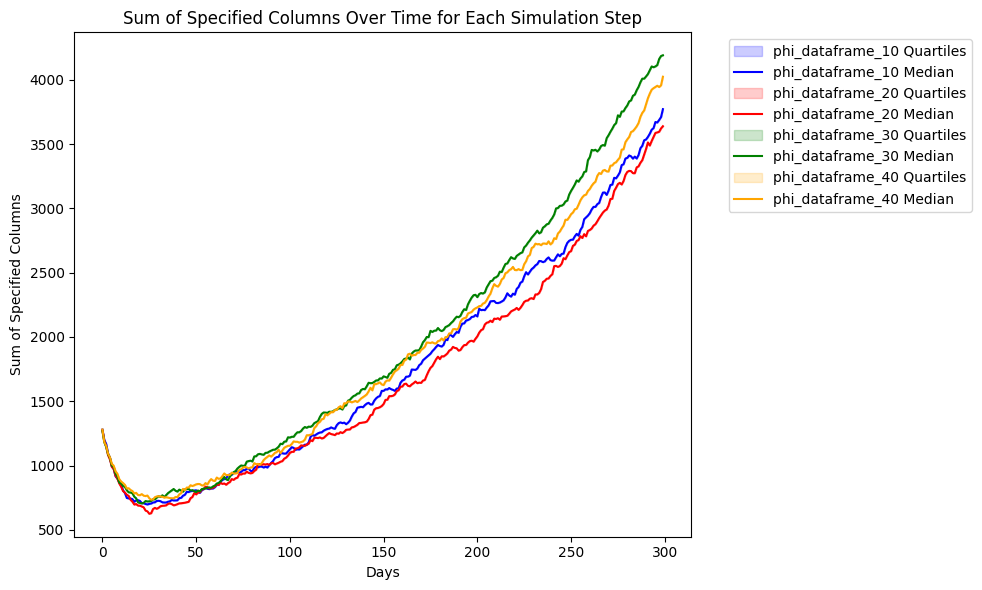

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))

colors = ['blue', 'red', 'green', 'orange']  # Colors for visibility
color_index = 0

for key, df in phi_dataframes.items():
    x_values = df['ticks']
    
    # Since we now possibly have multiple entries for the same 'ticks' due to concatenation,
    # we group by 'ticks' and calculate the quartiles and median for each group.
    grouped = df.groupby('ticks')['I'].agg(['quantile', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]).rename(columns={'quantile': 'median', '<lambda_0>': 'first_quartile', '<lambda_1>': 'third_quartile'})
    
    plt.fill_between(grouped.index, grouped['first_quartile'], grouped['third_quartile'], color=colors[color_index], alpha=0.2, label=f'{key} Quartiles')
    plt.plot(grouped.index, grouped['median'], label=f'{key} Median', color=colors[color_index], linestyle='-')
    
    color_index = (color_index + 1) % len(colors)  # Cycle through colors for visibility

plt.xlabel('Days')
plt.ylabel('Sum of Specified Columns')
plt.title('Sum of Specified Columns Over Time for Each Simulation Step')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

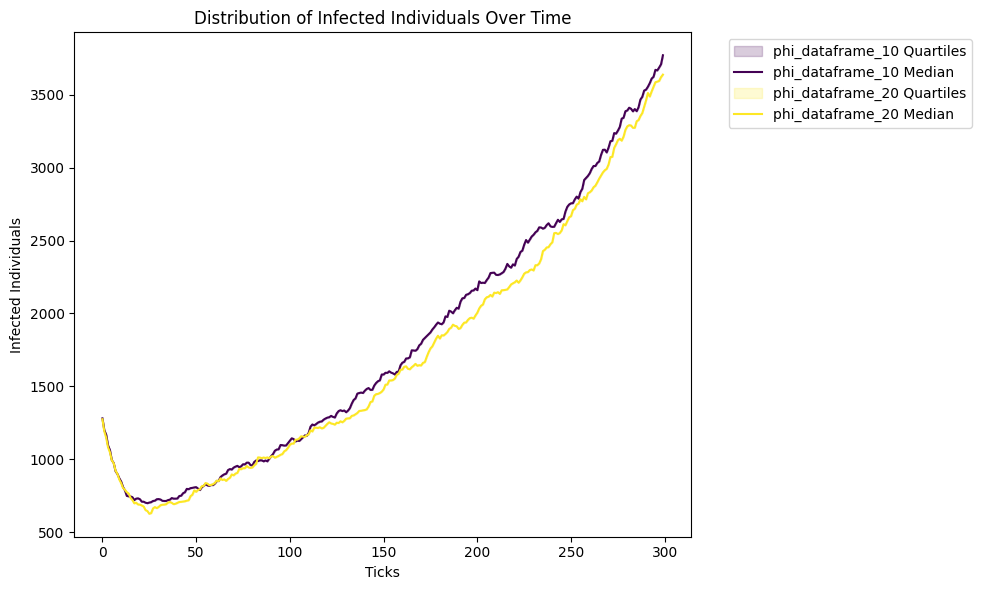

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10, 6))

# Define a colormap for differentiating between simulation steps
colors = plt.cm.viridis(np.linspace(0, 1, len(phi_dataframes)))

for (key, df), color in zip(phi_dataframes.items(), colors):
    # Group by 'ticks' and calculate quartiles and median
    grouped = df.groupby('ticks')['I'].agg([lambda x: x.quantile(0.25), lambda x: x.quantile(0.75), 'median']).rename(columns={'<lambda_0>': 'first_quartile', '<lambda_1>': 'third_quartile', 'median': 'median'})

    # Plotting the first and third quartiles as a filled area
    plt.fill_between(grouped.index, grouped['first_quartile'], grouped['third_quartile'], color=color, alpha=0.2, label=f'{key} Quartiles')
    
    # Plotting the median
    plt.plot(grouped.index, grouped['median'], label=f'{key} Median', color=color, linestyle='-')

plt.xlabel('Ticks')
plt.ylabel('Infected Individuals')
plt.title('Distribution of Infected Individuals Over Time')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


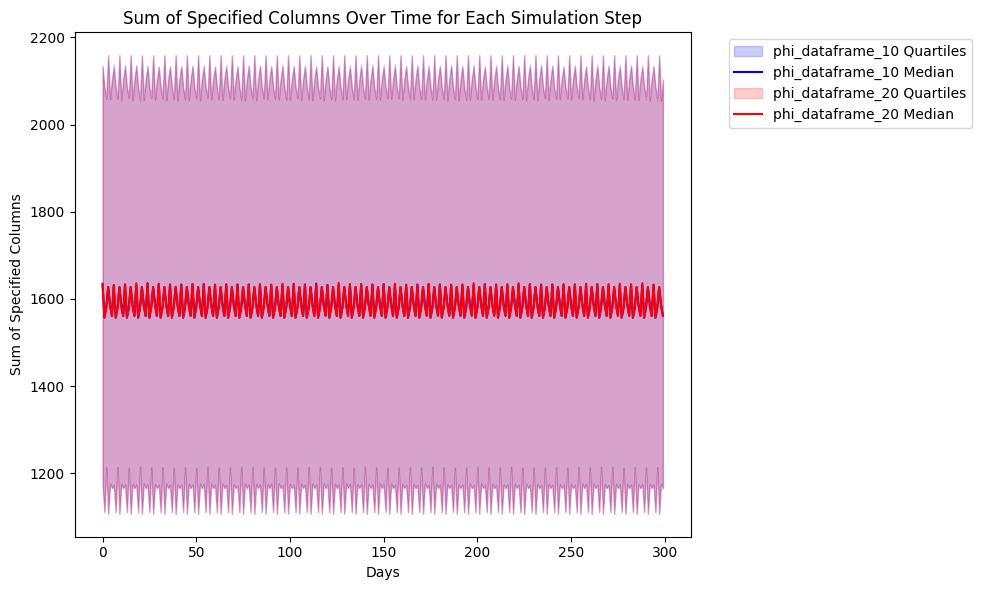

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
sum_columns = ['S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

phi_dataframes = {}  # Dictionary to store each DataFrame
simulation_steps = [10, 20]  # Example steps
start_index = 2  # Starting index
step = 3  # Step size
i_range = range(1, 5)  # Example range for 'i'

for simulation_step in simulation_steps:
    for i in range(20):
        file_path = f'{base_path}{simulation_step}_{i}_out.csv'
        df = pd.read_csv(file_path, skiprows=1, names=csv_header)
        
        # Summing specified columns for each tick
        df['Sum'] = df[sum_columns].sum(axis=1)
        
        # Selecting rows based on specified step
        step_df = df.iloc[start_index::step, :].copy()

        # Concatenating or adding the new DataFrame to the existing one in the dictionary
        key = f'phi_dataframe_{simulation_step}'
        if key in phi_dataframes:
            phi_dataframes[key] = pd.concat([phi_dataframes[key], step_df[['ticks', 'Sum']]])
        else:
            phi_dataframes[key] = step_df[['ticks', 'Sum']]

# Plotting
plt.figure(figsize=(10, 6))

colors = ['blue', 'red']  # Colors for visibility
color_index = 0

for key, df in phi_dataframes.items():
    x_values = df['ticks']
    
    # Since we now possibly have multiple entries for the same 'ticks' due to concatenation,
    # we group by 'ticks' and calculate the quartiles and median for each group.
    grouped = df.groupby('ticks')['Sum'].agg(['quantile', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]).rename(columns={'quantile': 'median', '<lambda_0>': 'first_quartile', '<lambda_1>': 'third_quartile'})
    
    plt.fill_between(grouped.index, grouped['first_quartile'], grouped['third_quartile'], color=colors[color_index], alpha=0.2, label=f'{key} Quartiles')
    plt.plot(grouped.index, grouped['median'], label=f'{key} Median', color=colors[color_index], linestyle='-')
    
    color_index = (color_index + 1) % len(colors)  # Cycle through colors for visibility

plt.xlabel('Days')
plt.ylabel('Sum of Specified Columns')
plt.title('Sum of Specified Columns Over Time for Each Simulation Step')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()




In [ ]:
import matplotlib.pyplot as plt

# Assuming phi_dataframes is already defined and filled as per the previous instructions

plt.figure(figsize=(10, 6))

colors = ['blue', 'red', 'green', 'purple', 'orange']  # Colors for different dataframes
color_index = 0

for key, df in phi_dataframes.items():
    # Calculate the quartiles and median for the 'Sum' column
    first_quartile = df['Sum'].quantile(0.25)
    third_quartile = df['Sum'].quantile(0.75)
    median_values = df['Sum'].median()
    
    # Creating x-axis values based on the 'ticks' column
    x_values = df['ticks']
    
    # Plotting the quartile range as a filled area
    plt.fill_between(x_values, first_quartile, third_quartile, color=colors[color_index], alpha=0.2, label=f'{key} Quartiles')
    
    # Plotting the median
    plt.plot(x_values, median_values, label=f'{key} Median', color=colors[color_index], linestyle='-')
    
    color_index = (color_index + 1) % len(colors)  # Move to the next color for the next dataframe

plt.xlabel('Days')
plt.ylabel('Infected Individuals')
plt.title('Infection Spread Across Simulations')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


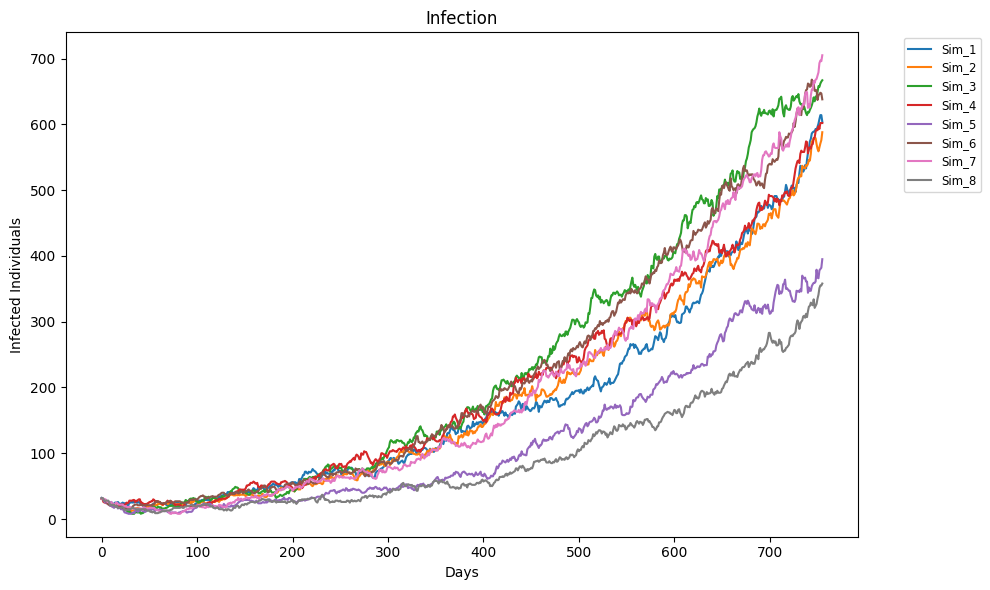

In [24]:
plt.figure(figsize=(10, 6))

for column in dataframe.columns:
    plt.plot(dataframe[column], label=column)

plt.xlabel('Days')
plt.ylabel('Infected Individuals')
plt.title('Infection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.tight_layout()

plt.show()


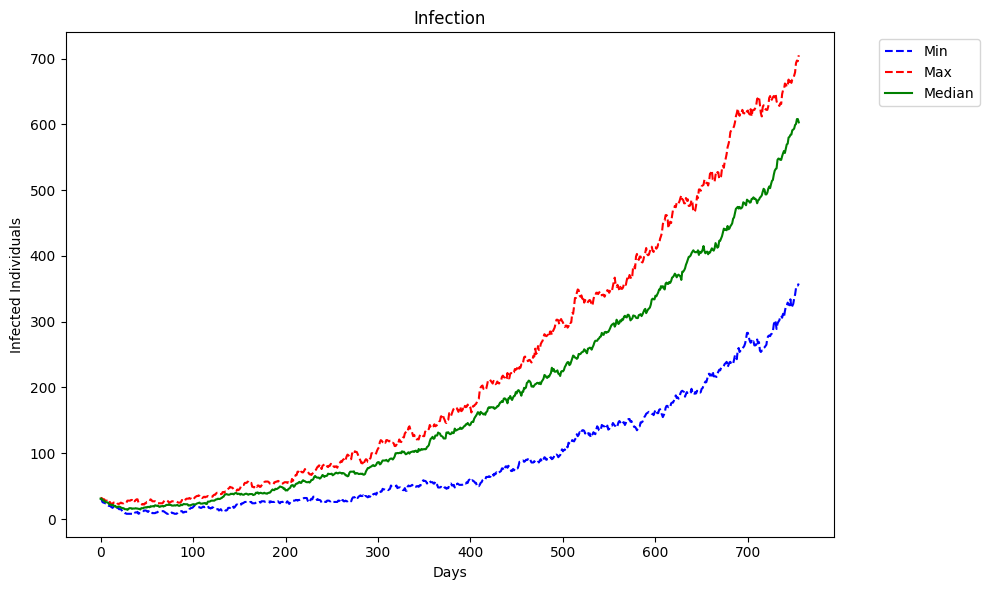

In [25]:
min_values = dataframe.min(axis=1)
max_values = dataframe.max(axis=1)
median_values = dataframe.median(axis=1)

plt.figure(figsize=(10, 6))

plt.plot(min_values, label='Min', linestyle='--', color='blue')
plt.plot(max_values, label='Max', linestyle='--', color='red')
plt.plot(median_values, label='Median', linestyle='-', color='green')

plt.xlabel('Days')
plt.ylabel('Infected Individuals')
plt.title('Infection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

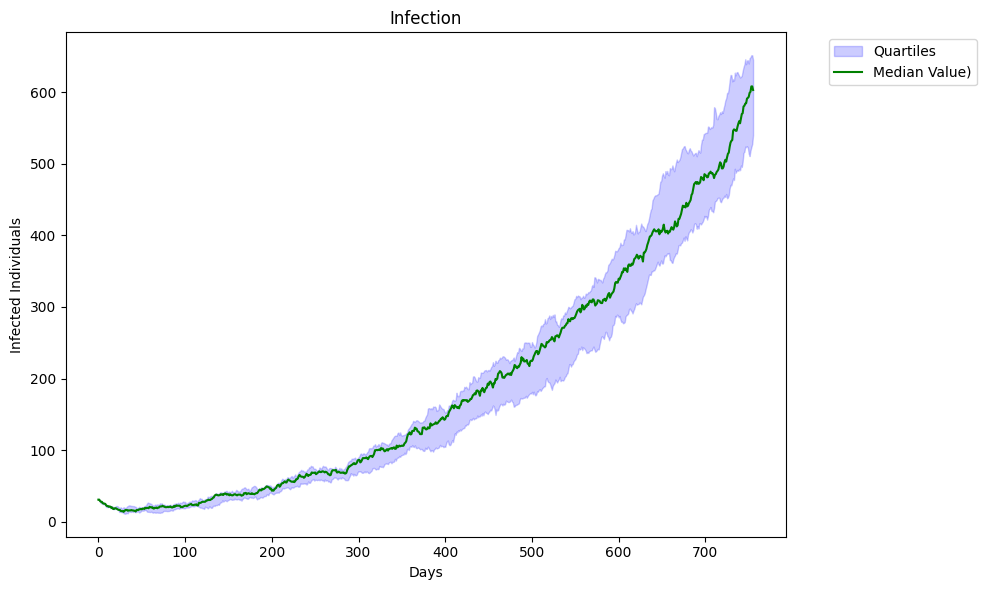

In [26]:
first_quartile = dataframe.quantile(0.25, axis=1)
third_quartile = dataframe.quantile(0.75, axis=1)
median_values = dataframe.median(axis=1)

plt.figure(figsize=(10, 6))

plt.fill_between(range(len(first_quartile)), first_quartile, third_quartile, color='blue', alpha=0.2, label='Quartiles')

plt.plot(median_values, label='Median Value)', color='green', linestyle='-')

plt.xlabel('Days')
plt.ylabel('Infected Individuals')
plt.title('Infection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [6]:
phi_dataframes

{'phi_dataframe_10':      ticks  Total_I
 0        0       63
 1        1      162
 2        2      147
 3        3      139
 4        4      117
 ..     ...      ...
 164    164      639
 165    165      656
 166    166      681
 167    167      696
 168    168      484
 
 [169 rows x 2 columns],
 'phi_dataframe_20':      ticks  Total_I
 0        0       61
 1        1      171
 2        2      144
 3        3      129
 4        4      136
 ..     ...      ...
 164    164      896
 165    165      913
 166    166      935
 167    167      966
 168    168      641
 
 [169 rows x 2 columns],
 'phi_dataframe_30':      ticks  Total_I
 0        0       62
 1        1      166
 2        2      137
 3        3      108
 4        4       95
 ..     ...      ...
 164    164      786
 165    165      798
 166    166      856
 167    167      837
 168    168      573
 
 [169 rows x 2 columns],
 'phi_dataframe_40':      ticks  Total_I
 0        0       61
 1        1      170
 2        2      145

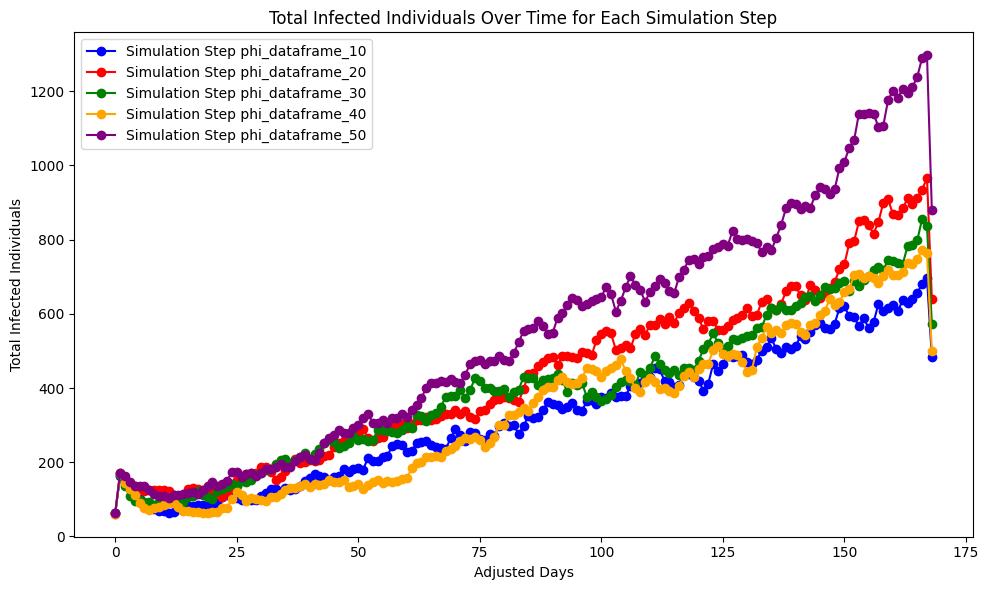

In [5]:
import matplotlib.pyplot as plt

# Prepare the plot
plt.figure(figsize=(10, 6))

colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if you have more than 5 simulation steps
color_index = 0

# Loop through each simulation step's DataFrame in phi_dataframes
for simulation_step, df in phi_dataframes.items():
    # Plotting 'Total_I' over 'ticks' for each simulation step
    plt.plot(df['ticks'], df['Total_I'], label=f'Simulation Step {simulation_step}', color=colors[color_index], linestyle='-', marker='o')
    
    # Move to the next color for the next simulation step
    color_index = (color_index + 1) % len(colors)

# Customize the plot
plt.xlabel('Adjusted Days')
plt.ylabel('Total Infected Individuals')
plt.title('Total Infected Individuals Over Time for Each Simulation Step')
plt.legend()

plt.tight_layout()
plt.show()


KeyError: "['S->I', 'I->R', 'I->H', 'H->R', 'R->S', 'I & H->R'] not in index"

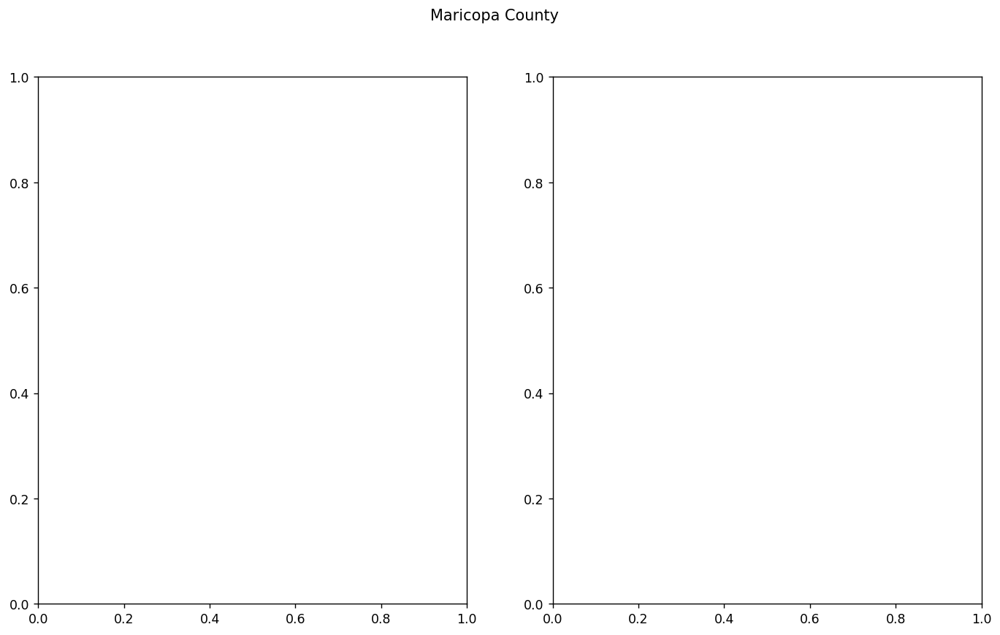

In [ ]:
plot_df.groupby(['ticks']).sum()
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(13.33,7.5), dpi=125)

fig.suptitle('Maricopa County')
sirh = ['S', 'I', 'R', 'H']
sirh_name = ['Susceptible', 'Infected', 'Recovered', 'hospitalized']
event_rate = ['R->S', 'S->I', 'I & H->R', 'I->H' ]
color = ['green', 'orange', 'blue', 'red']

Events = plot_df[['ticks', 'S->I', 'I->R', 'I->H','H->R', 'R->S', 'I & H->R']]
sirh_compartment = plot_df[['ticks', 'S', 'I', 'R', 'H']]
sirh_compartment = sirh_compartment.groupby(sirh_compartment['ticks'], as_index=False).sum()
Events = Events.groupby(Events['ticks'] // 14, as_index=False).sum()

max_beta = ['average_household_size', 'pop_density_km2', 'beta']
max_gamma = ['gamma', 'median_income', 'tract_gini_index']
# Plots sirh model
for i in range(4):
    sirh_compartment.plot(kind='line',
            y= sirh[i],
            ylabel="population", 
            logy=True,
            color=color[i], 
            ax=axes[1],
            title = 'SIRH mdoel') 
    Events.plot(kind='line', 
            y=event_rate[i],
            logy=True,
            color=color[i], 
            ax=axes[0],
            title = 'Event Rates')  

I have this csv file called 10**0_out.csv to 10**19*out.csv. I want to load each file an have the header of the file called ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S->E','E->I', 'I->E','VS_1->I', 'VS_1*>V', 'VR->V']. I think want to tha MEASLES_IPM = df[['ticks', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V_2']]
MEASLES_IPM = MEASLES_IPM.groupby(MEASLES_IPM['ticks'] // 2, as_index=False).sum(). I want to do this concept for all 20 of the csv files and then I jsut want to plot I. each of the loaded csv file should be it own line on the graph


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the headers to be used for loading the CSV files
headers = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S->E', 'E->I', 'I->E', 'VS_1->I', 'VS_1_>V', 'VR->V']

# Placeholder for the aggregated data
aggregated_data = pd.DataFrame()

# Loop through each file index (0 to 19)
for i in range(20):
    # Construct the file name
    file_name = f'10__{i}_out.csv'
    
    # Load the CSV file with the specified headers
    df = pd.read_csv(file_name, names=headers)
    
    # Select relevant columns for MEASLES_IPM
    MEASLES_IPM = df[['ticks', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V']]
    
    # Group by 'ticks // 2' and sum the groups
    MEASLES_IPM = MEASLES_IPM.groupby(MEASLES_IPM['ticks'] // 2, as_index=False).sum()
    
    # If this is the first file, initialize aggregated_data with MEASLES_IPM
    if i == 0:
        aggregated_data = MEASLES_IPM
    else:
        # For subsequent files, append the MEASLES_IPM data
        aggregated_data = pd.concat([aggregated_data, MEASLES_IPM], ignore_index=True)

# Since files are processed sequentially, there might be duplicate 'ticks' values.
# Group by 'ticks' again to aggregate data across all files
final_data = aggregated_data.groupby('ticks', as_index=False).sum()

# Plot 'I' column
plt.figure(figsize=(10, 6))
plt.plot(final_data['ticks'], final_data['I'], label='Infected')
plt.xlabel('Ticks')
plt.ylabel('Number of Infected Individuals')
plt.title('Infection Spread Over Time')
plt.legend()
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '10__0_out.csv'

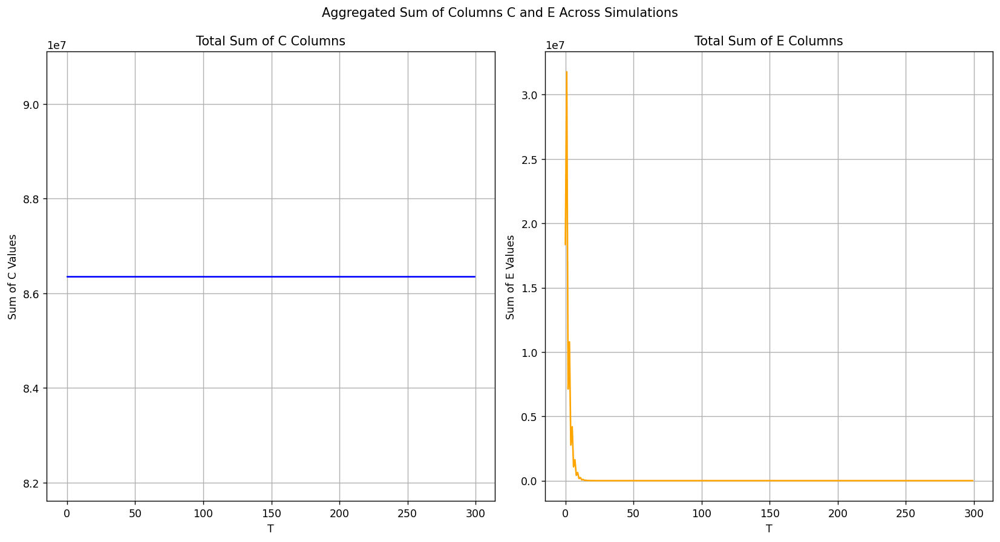

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Base path to the files, with a placeholder for the index
base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10__{}_out.csv'

# Initialize an empty DataFrame to store all data
all_data = pd.DataFrame()

# Loop through each file index
for i in range(20):  # 0 to 19 inclusive
    file_path = base_path.format(i)  # Format the string with the current index
    df = pd.read_csv(file_path)
    
    # Optionally, sum 'c' and 'e' columns here if needed, but we'll directly append to aggregate
    all_data = pd.concat([all_data, df], ignore_index=True)

# Group by 't' and sum the relevant columns
sum_c_columns = all_data.groupby('t')[[f'c{j}' for j in range(7)]].sum()
sum_e_columns = all_data.groupby('t')[[f'e{j}' for j in range(6)]].sum()

# Creating a sum across 'c' and 'e' columns respectively
sum_c_columns['Total_C'] = sum_c_columns.sum(axis=1)
sum_e_columns['Total_E'] = sum_e_columns.sum(axis=1)

# Plotting
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(13.33, 7.5), dpi=125)

# Sum of C columns plot
sum_c_columns['Total_C'].plot(kind='line', color='blue', ax=axes[0], title='Total Sum of C Columns')
axes[0].set_xlabel('T')
axes[0].set_ylabel('Sum of C Values')
axes[0].grid(True)

# Sum of E columns plot
sum_e_columns['Total_E'].plot(kind='line', color='orange', ax=axes[1], title='Total Sum of E Columns')
axes[1].set_xlabel('T')
axes[1].set_ylabel('Sum of E Values')
axes[1].grid(True)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle('Aggregated Sum of Columns C and E Across Simulations')
plt.show()

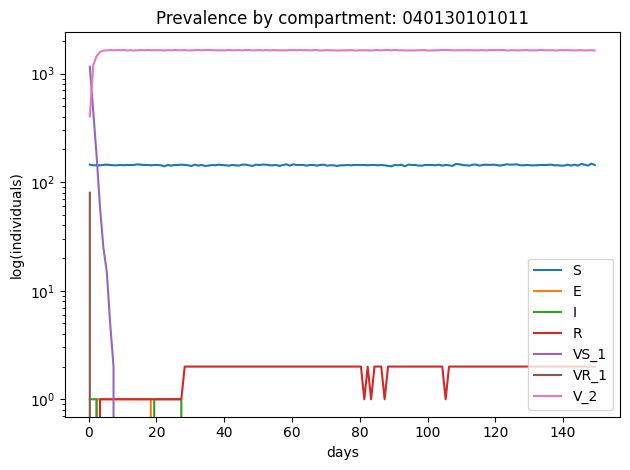

In [ ]:
def plot_pop(out, pop_idx, log_scale=True):
    """Plot all compartments for the population at the given index."""
    fig, ax = plt.subplots()
    ax.set_title(f"Prevalence by compartment: {out.geo_labels[pop_idx]}")
    ax.set_xlabel('days')
    ax.set_ylabel('log(individuals)' if log_scale else 'individuals')
    if log_scale:
        ax.set_yscale('log')

    x_axis = out.ticks_in_days[::2]  
    y_axis = out.prevalence[::2, pop_idx, :]
    
    # Plot each compartment separately to handle the mismatch in dimensions
    for i, label in enumerate(out.compartment_labels):
        ax.plot(x_axis, y_axis[:, i], label=label)

    if out.dim.compartments <= 12:
        ax.legend()

    fig.tight_layout()
    plt.show()

plot_pop(output, pop_idx=0)
save_csv(path=dir, out =output )


In [ ]:
out_file = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/{phi}_out.csv'
save_csv(path=out_file, out =output )


'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10_out.csv'

In [ ]:
save_csv(path=out_file, out =output )


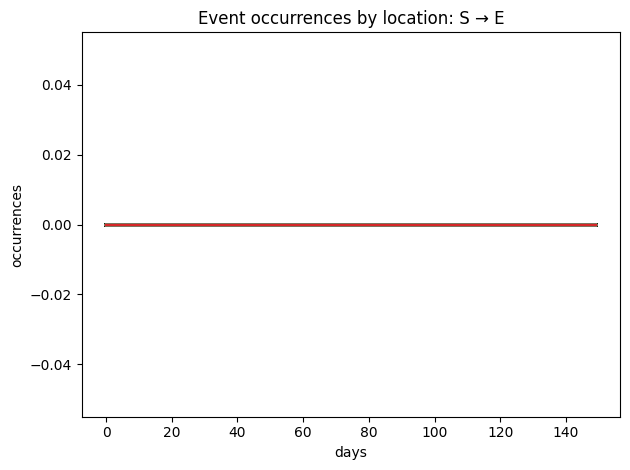

In [ ]:
plot_event(output, event_idx= 0)

In [ ]:
data = output.prevalence
data

array([[[ 145,    0,    1, ..., 1158,   80,  404],
        [ 161,    0,    0, ..., 1301,   93,  449],
        [ 102,    0,    0, ...,  850,   59,  259],
        ...,
        [ 139,    0,    0, ..., 1154,   84,  398],
        [ 232,    0,    0, ..., 1883,  130,  621],
        [ 329,    0,    0, ..., 2778,  190,  821]],

       [[ 144,    0,    1, ...,  583,    0, 1064],
        [ 161,    0,    0, ...,  694,    0, 1152],
        [ 102,    0,    0, ...,  414,    0,  748],
        ...,
        [ 150,    0,    0, ...,  637,    0, 1078],
        [ 244,    0,    0, ..., 1017,    0, 1788],
        [ 344,    0,    0, ..., 1495,    0, 2452]],

       [[ 143,    0,    1, ...,  451,    0, 1194],
        [ 161,    0,    0, ...,  522,    0, 1326],
        [ 102,    0,    0, ...,  299,    0,  860],
        ...,
        [ 147,    0,    0, ...,  448,    0, 1182],
        [ 235,    0,    0, ...,  746,    0, 1906],
        [ 328,    0,    0, ..., 1070,    0, 2717]],

       ...,

       [[ 144,    0,    

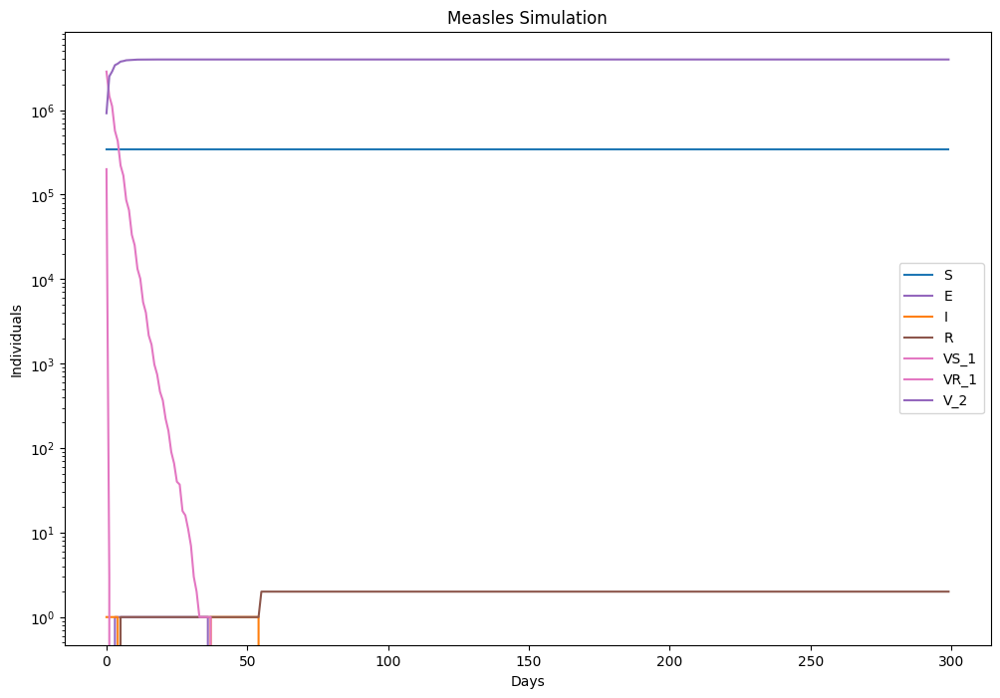

In [ ]:
compartments = ['S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2']
colors_rg_friendly = ['tab:blue', 'tab:purple', 'tab:orange', 'tab:brown', 'tab:pink', 'tab:pink','tab:purple', 'tab:orange', 'tab:brown', 'tab:pink',]
summed_data_all_compartments = data.sum(axis=1)

plt.figure(figsize=(12, 8))

for i, label in enumerate(compartments):
    plt.plot(summed_data_all_compartments[:, i], label=f'{label}', color=colors_rg_friendly[i])


plt.yscale('log')  # Setting the y-axis to log scale
plt.title('Measles Simulation')
plt.xlabel('Days')
plt.ylabel('Individuals')
plt.legend()
plt.show()



# Centroid Movement


In [ ]:
def haversine(centroid_1_lon: float, centroid_1_lat: float,
              centroid_2_lon: float, centroid_2_lat: float) -> np.double:
    R = 3959.87433
    dLat = np.radians(centroid_1_lat - centroid_2_lat)
    dLon = np.radians(centroid_1_lon - centroid_2_lon)
    lat1 = np.radians(centroid_1_lat)
    lat2 = np.radians(centroid_2_lat)

    a = np.sin(dLat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dLon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    
    return R * c

In [ ]:
from typing import (Any, Callable, Generator, Generic, Iterable, Literal,
                    OrderedDict, TypeVar)

In [ ]:
from numpy.typing import DTypeLike, NDArray
N = TypeVar('N', bound=np.number)

NDIndices = NDArray[np.intp]


In [ ]:
def row_normalize(arr: NDArray[N], row_sums: NDArray[N] | None = None, dtype: DTypeLike = None) -> NDArray[N]:
    """
    Assuming `arr` is a 2D array, normalize values across each row by dividing by the row sum.
    If you've already calculated row sums, you can pass those in, otherwise they will be computed.
    """
    if row_sums is None:
        row_sums = arr.sum(axis=1, dtype=dtype)
    # We do a maximum(1, ...) here to protect against div-by-zero:
    # if we assume `arr` is strictly non-negative and if a row-sum is zero,
    # then every entry in the row is zero therefore dividing by 1 is fine.
    return arr / np.maximum(1, row_sums[:, np.newaxis])  # type: ignore
    # numpy's types are garbage


RADIUS_MI = 3959.87433  # radius of earth in mi


def pairwise_haversine(longitudes: NDArray[np.float64], latitudes: NDArray[np.float64]) -> NDArray[np.float64]:
    """Compute the distances in miles between all pairs of coordinates."""
    # https://www.themathdoctors.org/distances-on-earth-2-the-haversine-formula
    lng = np.radians(longitudes)
    lat = np.radians(latitudes)
    dlng = lng[:, np.newaxis] - lng[np.newaxis, :]
    dlat = lat[:, np.newaxis] - lat[np.newaxis, :]
    cos_lat = np.cos(lat)

    a = np.sin(dlat / 2.0) ** 2 \
        + (cos_lat[:, np.newaxis] * cos_lat[np.newaxis, :]) \
        * np.sin(dlng / 2.0) ** 2
    return 2 * RADIUS_MI * np.arcsin(np.sqrt(a))


In [ ]:

def centroids_movement():
    centroid = geo['centroid']
    distance = pairwise_haversine(centroid['longitude'], centroid['latitude'])
    dispersal_kernel = row_normalize(1 / np.exp(distance / params['phi']))
    return { 'dispersal_kernel': dispersal_kernel }



In [ ]:
dir = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/Movement_model')


In [ ]:
geo_df

,average_household_size,centroid,geoid,label,median_age,median_income,pop_density_km2,population,population_by_age,population_by_age_x6,tract_gini_index,tract_median_income
0,2.33,"[-111.77075643330394, 33.76924660709943]",040130101011,040130101011,50.5,99219,99.319999,1791,"[358, 1155, 278]","[358, 110, 671, 374, 194, 84]",0.4423,99489
1,2.15,"[-111.72000671148204, 33.7410933260103]",040130101012,040130101012,63.9,127614,68.782398,2007,"[162, 883, 962]","[162, 0, 423, 460, 559, 403]",0.4423,99489
2,1.83,"[-111.66697569766907, 33.72404113568911]",040130101013,040130101013,70.8,80742,183.890869,1264,"[0, 271, 993]","[0, 22, 0, 249, 655, 338]",0.4423,99489
3,2.04,"[-111.49136471795472, 33.71546544071483]",040130101021,040130101021,58.9,105987,0.480805,1139,"[58, 775, 306]","[58, 52, 361, 362, 258, 48]",0.5439,134865
4,2.20,"[-111.8505100649063, 33.82609833466325]",040130101022,040130101022,62.8,128523,125.420289,1487,"[110, 784, 593]","[110, 82, 202, 500, 452, 141]",0.5439,134865
...,...,...,...,...,...,...,...,...,...,...,...,...
2489,4.16,"[-111.87417248956888, 33.51676571547603]",040139413001,040139413001,32.7,38750,54.106432,1979,"[805, 1077, 97]","[805, 320, 579, 178, 84, 13]",0.4913,35933
2490,4.15,"[-111.75549278099597, 33.52975077659579]",040139413002,040139413002,33.4,46250,6.065374,834,"[174, 594, 66]","[174, 294, 188, 112, 56, 10]",0.4913,35933
2491,1.87,"[-111.88183665206864, 33.4507490858319]",040139413003,040139413003,64.8,33720,169.206887,1865,"[62, 889, 914]","[62, 232, 199, 458, 520, 394]",0.4913,35933
2492,4.29,"[-111.84018577905717, 33.49859253583006]",040139413004,040139413004,26.7,36384,110.898169,3049,"[1157, 1683, 209]","[1157, 735, 609, 339, 172, 37]",0.4913,35933


In [ ]:
census_block_groups

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,+33.4123043,-111.7788867,"POLYGON ((427100.723 3697614.906, 427237.685 3..."
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,+33.6422660,-112.3722104,"POLYGON ((372323.452 3723522.221, 372331.103 3..."
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,+33.5654583,-112.1989360,"POLYGON ((388347.235 3714764.666, 388348.079 3..."
5,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,+33.5408739,-112.2472748,"POLYGON ((383469.255 3711596.776, 383469.334 3..."
6,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,+33.5113085,-112.1797305,"POLYGON ((390223.962 3708403.396, 390225.485 3..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4139,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,+33.2801026,-111.8638617,"POLYGON ((418884.826 3683057.566, 418958.788 3..."
4140,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,+33.2802159,-111.8501034,"POLYGON ((420043.154 3683071.365, 420060.468 3..."
4141,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,+33.2876864,-111.8502128,"POLYGON ((420033.499 3683935.182, 420063.570 3..."
4176,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,+33.3097028,-111.8546715,"POLYGON ((420024.315 3685692.562, 420027.174 3..."


In [ ]:
import pandas as pd

# Assuming census_block_groups is your existing DataFrame
# Ensure the latitude and longitude columns are in float format
census_block_groups['INTPTLAT'] = pd.to_numeric(census_block_groups['INTPTLAT'], errors='coerce')
census_block_groups['INTPTLON'] = pd.to_numeric(census_block_groups['INTPTLON'], errors='coerce')

# Create the 'centroid' column by combining 'INTPTLON' and 'INTPTLAT' into a tuple
census_block_groups['centroid'] = census_block_groups.apply(lambda row: (row['INTPTLON'], row['INTPTLAT']), axis=1)

# Now, census_block_groups has a new column 'centroid' with the desired tuple format
census_block_groups

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((-111.78406 33.41540, -111.78259 33.4...","(-111.7788867, 33.4123043)"
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((-112.37679 33.64389, -112.37673 33.6...","(-112.3722104, 33.642266)"
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((-112.20294 33.56672, -112.20293 33.5...","(-112.198936, 33.5654583)"
5,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((-112.25507 33.53763, -112.25507 33.5...","(-112.2472748, 33.5408739)"
6,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((-112.18194 33.50955, -112.18193 33.5...","(-112.1797305, 33.5113085)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4139,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((-111.87111 33.28352, -111.87031 33.2...","(-111.8638617, 33.2801026)"
4140,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((-111.85867 33.28374, -111.85848 33.2...","(-111.8501034, 33.2802159)"
4141,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((-111.85885 33.29153, -111.85853 33.2...","(-111.8502128, 33.2876864)"
4176,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((-111.85910 33.30737, -111.85908 33.3...","(-111.8546715, 33.3097028)"


In [ ]:
census_block_groups['centroid'][1]

(-112.3722104, 33.642266)

In [ ]:
census_block_groups.reset_index(drop=True, inplace=True)


In [ ]:
num_labels = len(census_block_groups['GEOID'])
distances = np.zeros((num_labels, num_labels))
phi_values = np.zeros((num_labels, num_labels))
phi_0 = 0.10
for i in range(num_labels):
    for j in range(num_labels):
        if i != j:
            # Accessing centroid values safely
            centroid_i = census_block_groups.at[i, 'centroid']
            centroid_j = census_block_groups.at[j, 'centroid']
            distances[i, j] = haversine(centroid_i[0], centroid_i[1], centroid_j[0], centroid_j[1])


In [ ]:
geo_df

,average_household_size,centroid,geoid,label,median_age,median_income,pop_density_km2,population,population_by_age,population_by_age_x6,tract_gini_index,tract_median_income
0,2.33,"[-111.77075643330394, 33.76924660709943]",040130101011,040130101011,50.5,99219,99.319999,1791,"[358, 1155, 278]","[358, 110, 671, 374, 194, 84]",0.4423,99489
1,2.15,"[-111.72000671148204, 33.7410933260103]",040130101012,040130101012,63.9,127614,68.782398,2007,"[162, 883, 962]","[162, 0, 423, 460, 559, 403]",0.4423,99489
2,1.83,"[-111.66697569766907, 33.72404113568911]",040130101013,040130101013,70.8,80742,183.890869,1264,"[0, 271, 993]","[0, 22, 0, 249, 655, 338]",0.4423,99489
3,2.04,"[-111.49136471795472, 33.71546544071483]",040130101021,040130101021,58.9,105987,0.480805,1139,"[58, 775, 306]","[58, 52, 361, 362, 258, 48]",0.5439,134865
4,2.20,"[-111.8505100649063, 33.82609833466325]",040130101022,040130101022,62.8,128523,125.420289,1487,"[110, 784, 593]","[110, 82, 202, 500, 452, 141]",0.5439,134865
...,...,...,...,...,...,...,...,...,...,...,...,...
2489,4.16,"[-111.87417248956888, 33.51676571547603]",040139413001,040139413001,32.7,38750,54.106432,1979,"[805, 1077, 97]","[805, 320, 579, 178, 84, 13]",0.4913,35933
2490,4.15,"[-111.75549278099597, 33.52975077659579]",040139413002,040139413002,33.4,46250,6.065374,834,"[174, 594, 66]","[174, 294, 188, 112, 56, 10]",0.4913,35933
2491,1.87,"[-111.88183665206864, 33.4507490858319]",040139413003,040139413003,64.8,33720,169.206887,1865,"[62, 889, 914]","[62, 232, 199, 458, 520, 394]",0.4913,35933
2492,4.29,"[-111.84018577905717, 33.49859253583006]",040139413004,040139413004,26.7,36384,110.898169,3049,"[1157, 1683, 209]","[1157, 735, 609, 339, 172, 37]",0.4913,35933


In [ ]:
num_labels = len(geo_df['geoid'])
distances = np.zeros((num_labels, num_labels))
phi_values = np.zeros((num_labels, num_labels))
phi_0 = 0.10

# Calculate distances
for i in range(num_labels):
    for j in range(num_labels):
        if i != j:
            distances[i, j] = haversine(geo_df['centroid'][i][0], geo_df['centroid'][i][1],
                                       geo_df['centroid'][j][0], geo_df['centroid'][j][1])

In [ ]:
num_labels = len(geo_df['geoid'])
distances = np.zeros((num_labels, num_labels))
phi_values = np.zeros((num_labels, num_labels))
phi_0 = 0.10

# Calculate distances
for i in range(num_labels):
    for j in range(num_labels):
        if i != j:
            distances[i, j] = haversine(geo_df['centroid'][i][0], geo_df['centroid'][i][1],
                                       geo_df['centroid'][j][0], geo_df['centroid'][j][1])
            
num_labels = len(census_block_groups['GEOID'])
distances = np.zeros((num_labels, num_labels))
phi_values = np.zeros((num_labels, num_labels))
phi_0 = 0.10
for i in range(num_labels):
    for j in range(num_labels):
        if i != j:
            # Accessing centroid values safely
            centroid_i = census_block_groups.at[i, 'centroid']
            centroid_j = census_block_groups.at[j, 'centroid']
            distances[i, j] = haversine(centroid_i[0], centroid_i[1], centroid_j[0], centroid_j[1])

phi_10 = 1 / np.exp(distances * (1/10))
phi_20 = 1 / np.exp(distances * (1/20))
phi_30 = 1 / np.exp(distances * (1/30))
phi_40 = 1 / np.exp(distances * (1/40))
phi_50 = 1 / np.exp(distances * (1/50))

# Save phi and distances as CSV
phi_10_df = pd.DataFrame(phi_10)
phi_20_df = pd.DataFrame(phi_20)
phi_30_df = pd.DataFrame(phi_30)
phi_40_df = pd.DataFrame(phi_40)
phi_50_df = pd.DataFrame(phi_50)
dist_df = pd.DataFrame(distances)
p_cbg = 540
cgb_d = dist_df.iloc[:, p_cbg]
cgb_10 = phi_10_df.iloc[:, p_cbg]
cgb_20 = phi_20_df.iloc[:, p_cbg]
cgb_30 = phi_30_df.iloc[:, p_cbg]
cgb_40 = phi_40_df.iloc[:, p_cbg]
cgb_50 = phi_50_df.iloc[:, p_cbg]

cgb = pd.concat([cgb_d, cgb_10, cgb_20, cgb_30, cgb_40, cgb_50], axis=1)

cgb.columns = ["distance", "phi 10", "phi 20", "phi 30", "phi 40", "phi 50"]
cgb
sim_data_df = [census_block_groups,cgb] 
sim_df = pd.concat(sim_data_df, axis =1)

gpd_df = gpd.GeoDataFrame(sim_df)
gpd_df

KeyError: 3

In [ ]:
sim_data_df = [census_block_groups,cgb] 
sim_df = pd.concat(sim_data_df, axis =1)

gpd_df = gpd.GeoDataFrame(sim_df)
gpd_df

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid,distance,phi 10,phi 20,phi 30,phi 40,phi 50
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((-111.78406 33.41540, -111.78259 33.4...","(-111.7788867, 33.4123043)",43.618281,0.012755,0.112938,0.233647,0.336063,0.417962
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((-112.37679 33.64389, -112.37673 33.6...","(-112.3722104, 33.642266)",22.087580,0.109837,0.331417,0.478905,0.575688,0.642909
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((-112.20294 33.56672, -112.20293 33.5...","(-112.198936, 33.5654583)",10.734893,0.341814,0.584648,0.699192,0.764623,0.806785
3,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((-112.25507 33.53763, -112.25507 33.5...","(-112.2472748, 33.5408739)",7.233647,0.485117,0.696504,0.785746,0.834568,0.865305
4,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((-112.18194 33.50955, -112.18193 33.5...","(-112.1797305, 33.5113085)",7.005189,0.496328,0.704505,0.791753,0.839348,0.869268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((-111.87111 33.28352, -111.87031 33.2...","(-111.8638617, 33.2801026)",41.384910,0.015947,0.126281,0.251705,0.355360,0.437054
2501,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((-111.85867 33.28374, -111.85848 33.2...","(-111.8501034, 33.2802159)",42.470681,0.014306,0.119608,0.242758,0.345844,0.427666
2502,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((-111.85885 33.29153, -111.85853 33.2...","(-111.8502128, 33.2876864)",42.039747,0.014936,0.122213,0.246270,0.349590,0.431367
2503,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((-111.85910 33.30737, -111.85908 33.3...","(-111.8546715, 33.3097028)",40.499579,0.017423,0.131997,0.259244,0.363313,0.444862


In [ ]:
sim_data_df = [census_block_groups,cgb] 
sim_df = pd.concat(sim_data_df, axis =1)

gpd_df = gpd.GeoDataFrame(sim_df)
gpd_df

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid,distance,phi 10,phi 20,phi 30,phi 40,phi 50
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((427100.723 3697614.906, 427237.685 3...","(-111.7788867, 33.4123043)",27.080452,0.066667,0.258200,0.405481,0.508133,0.581811
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((372323.452 3723522.221, 372331.103 3...","(-112.3722104, 33.642266)",13.713095,0.253774,0.503760,0.633115,0.709761,0.760133
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((388347.235 3714764.666, 388348.079 3...","(-112.198936, 33.5654583)",6.664768,0.513515,0.716599,0.800788,0.846522,0.875207
3,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((383469.255 3711596.776, 383469.334 3...","(-112.2472748, 33.5408739)",4.491017,0.638201,0.798875,0.860966,0.893798,0.914095
4,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((390223.962 3708403.396, 390225.485 3...","(-112.1797305, 33.5113085)",4.349178,0.647318,0.804561,0.865046,0.896973,0.916692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((418884.826 3683057.566, 418958.788 3...","(-111.8638617, 33.2801026)",25.693861,0.076583,0.276736,0.424662,0.526057,0.598172
2501,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((420043.154 3683071.365, 420060.468 3...","(-111.8501034, 33.2802159)",26.367963,0.071590,0.267564,0.415226,0.517265,0.590161
2502,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((420033.499 3683935.182, 420063.570 3...","(-111.8502128, 33.2876864)",26.100417,0.073531,0.271167,0.418946,0.520737,0.593328
2503,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((420024.315 3685692.562, 420027.174 3...","(-111.8546715, 33.3097028)",25.144202,0.080910,0.284446,0.432514,0.533335,0.604784


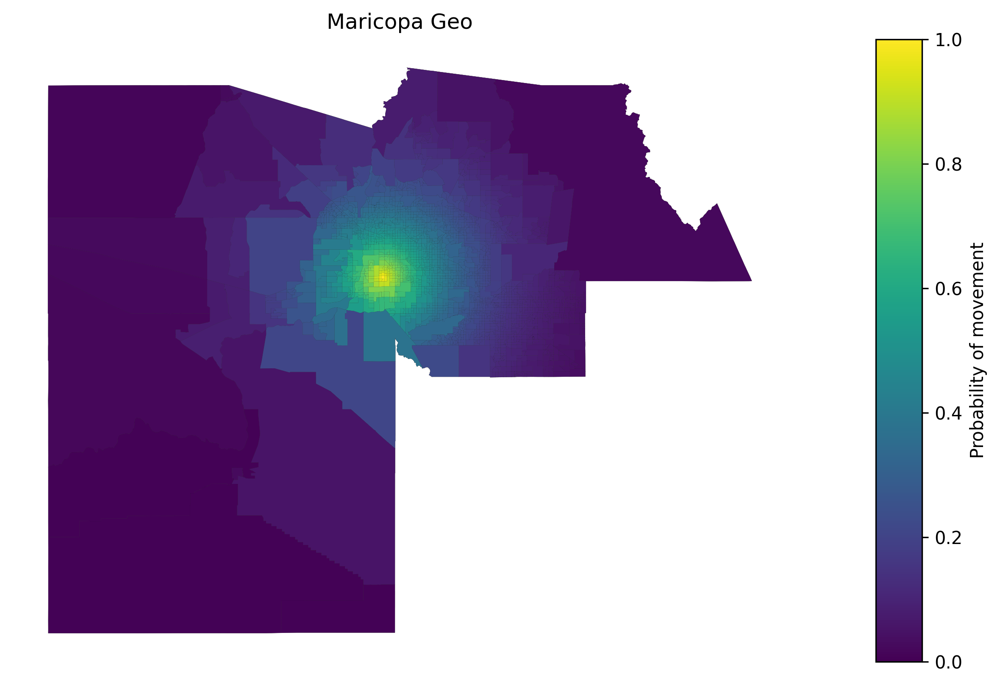

In [ ]:
# Create the figure and axes
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)


# Plot the map
census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='grey',
    linewidth=0.1
)

gpd_df.plot(
    ax=ax,
    edgecolor='black',
    column='phi 20',
    legend=True,
    cmap='viridis', 
    vmin=0,
    vmax=1,
    linewidth=0.005,
    cax=cax,
    legend_kwds={"label": 'Probability of movement', "orientation": "vertical"},
)

# Set the title
ax.set_title('Maricopa Geo')
ax.axis('off')
# Saves map

# Show the plot
plt.show()

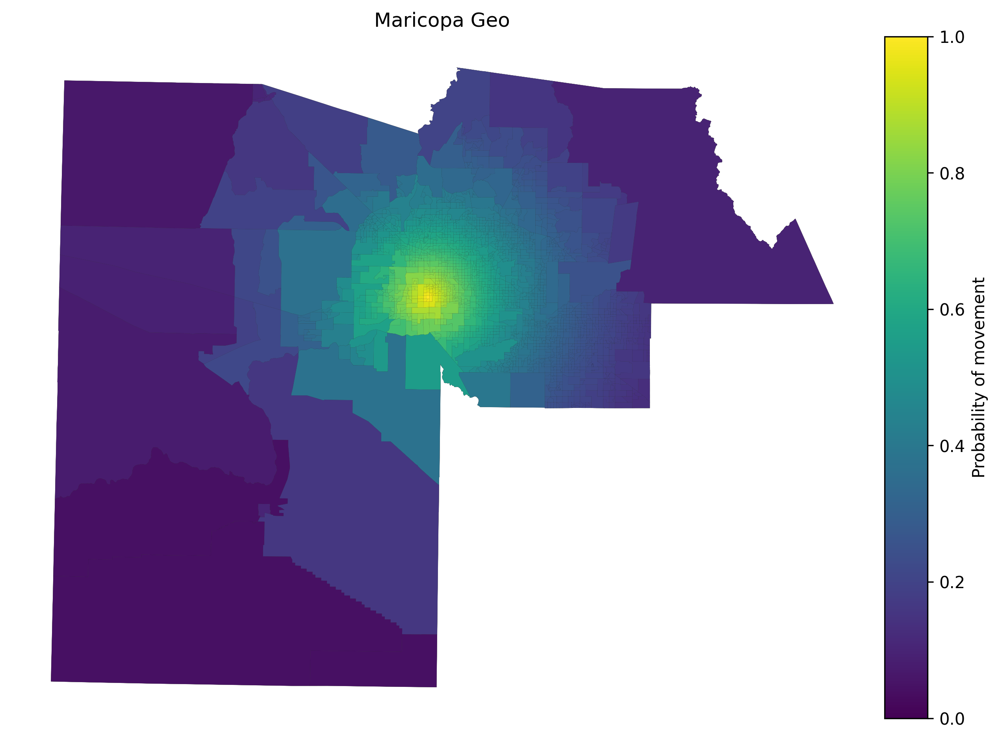

In [ ]:
# Create the figure and axes
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)


# Plot the map
census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='grey',
    linewidth=0.1
)

gpd_df.plot(
    ax=ax,
    edgecolor='black',
    column='phi 20',
    legend=True,
    cmap='viridis', 
    vmin=0,
    vmax=1,
    linewidth=0.005,
    cax=cax,
    legend_kwds={"label": 'Probability of movement', "orientation": "vertical"},
)

# Set the title
ax.set_title('Maricopa Geo')
ax.axis('off')
# Saves map

# Show the plot
plt.show()

In [ ]:
min(phi)

' '

In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.patches import Patch
import imageio
import os

# Assuming 'gpd_df' and 'census_block_groups' are already loaded GeoDataFrames

# Setup for saving individual frames
frames_dir = "phi_frames"
os.makedirs(frames_dir, exist_ok=True)

phi_values = ['phi 50', 'phi 40', 'phi 30', 'phi 20', 'phi 10']
base_color = '#f4b816'
alpha_values = [0.2, 0.3, 0.4, 0.6, 0.9]

# Generate phi_percent values for increasing and then decreasing
phi_percents = [x * 0.01 for x in range(20, 96, 5)] + [x * 0.01 for x in range(95, 15, -5)]

frames = []  # To hold filenames of frames for the GIF

for phi_percent in phi_percents:
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    census_block_groups.plot(ax=ax, edgecolor='black', color='lightgrey', linewidth=0.1)

    for i, phi in enumerate(phi_values):
        alpha = alpha_values[i]
        
        filtered_phi = gpd_df[gpd_df[phi] > phi_percent].copy()
        if not filtered_phi.empty:
            dissolved_phi = filtered_phi.dissolve()
            dissolved_phi.plot(
                ax=ax,
                color=base_color,
                edgecolor='black',
                linewidth=0.5,
                alpha=alpha,
            )

    filtered_gpd_df_distance_zero = gpd_df[gpd_df['distance'] == 0]
    if not filtered_gpd_df_distance_zero.empty:
        filtered_gpd_df_distance_zero.plot(ax=ax, color='black', edgecolor='black', linewidth=0.005, alpha=0.5)

    ax.axis('off')
    ax.set_title(f'Gravity Phi - Phi Values > {phi_percent:.2f}')
    legend_handles = [Patch(facecolor=base_color, edgecolor='black', alpha=alpha, label=phi) for alpha, phi in zip(alpha_values, phi_values)]
    ax.legend(handles=legend_handles, title=f"Phi Values > {phi_percent:.2f}")

    # Save the frame
    frame_filename = os.path.join(frames_dir, f"frame_{phi_percent:.2f}.png")
    plt.savefig(frame_filename)
    plt.close()
    frames.append(frame_filename)

# Create GIF from frames
with imageio.get_writer('phi_animation.gif', mode='I', fps=2) as writer:
    for frame_filename in frames:
        image = imageio.imread(frame_filename)
        writer.append_data(image)

# Cleanup frames if desired
# for frame_filename in frames:
#     os.remove(frame_filename)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd
from matplotlib.patches import Patch
import matplotlib.lines as mlines
import imageio
import os

frames_dir = "phi_frames"
os.makedirs(frames_dir, exist_ok=True)


phi_values = ['phi 50', 'phi 40', 'phi 30', 'phi 20', 'phi 10']
base_color = '#f4b816'  
alpha_values = [0.2, 0.3, 0.4, 0.6, 0.9]

cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", [base_color, base_color])

phi_percents = [x * 0.01 for x in range(20, 96, 5)] + [x * 0.01 for x in range(95, 15, -5)]

frames = []

for phi_percent in phi_percents:
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    census_block_groups.plot(ax=ax, edgecolor='black', color='lightgrey', linewidth=0.1)
    
    for i, phi in enumerate(phi_values):
        alpha = alpha_values[i]
        
        filtered_phi = gpd_df[gpd_df[phi] > phi_percent].copy()
        if not filtered_phi.empty:
            dissolved_phi = filtered_phi.dissolve()
            dissolved_phi.plot(
                ax=ax,
                color=base_color,
                edgecolor='black',
                linewidth=0.5,
                alpha=alpha,
            )

    filtered_gpd_df_distance_zero = gpd_df[gpd_df['distance'] == 0]
    if not filtered_gpd_df_distance_zero.empty:
        filtered_gpd_df_distance_zero.plot(ax=ax, color='black', edgecolor='black', linewidth=0.005, alpha=0.5)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
    cbar.outline.set_edgecolor('black')
    cbar.set_label('Proability of Movement', rotation=270, labelpad=15)

    cbar.ax.axhline(phi_percent, color='black', linewidth=2)

    ax.axis('off')
    ax.set_title(f'Gravity Phi - Phi Values > {phi_percent:.2f}')
    legend_handles = [Patch(facecolor=base_color, edgecolor='black', alpha=alpha, label=phi) for alpha, phi in zip(alpha_values, phi_values)]
    ax.legend(handles=legend_handles, title=f"Phi Values > {phi_percent:.2f}")

    frame_filename = os.path.join(frames_dir, f"frame_{phi_percent:.2f}.png")
    plt.savefig(frame_filename)
    plt.close()
    frames.append(frame_filename)

with imageio.get_writer('phi_animation.gif', mode='I', fps=2, loop=0) as writer:
    for frame_filename in frames:
        image = imageio.imread(frame_filename)
        writer.append_data(image)



/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_71760/3122730312.py:66: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame_filename)


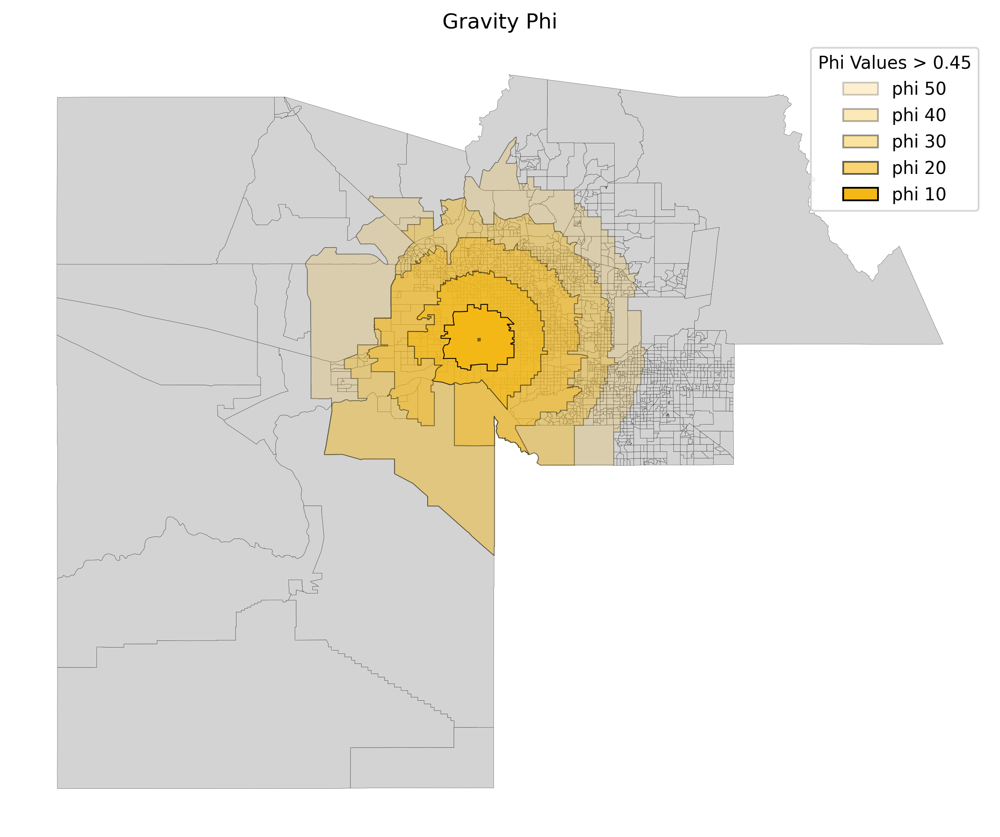

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
filtered_gpd_df_distance_zero = gpd_df[gpd_df['distance'] == 0]

census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='lightgrey',
    linewidth=0.1
)

phi_values = ['phi 50', 'phi 40', 'phi 30', 'phi 20', 'phi 10']
base_color = '#f4b816' 

alpha_values = [0.2, 0.3, 0.4, 0.6, 1]

phi_percent = 0.45

for i, phi in enumerate(phi_values):
    alpha = alpha_values[i]  

    filtered_phi = gpd_df[gpd_df[phi] > phi_percent]

    dissolved_phi = filtered_phi.dissolve()

    if not dissolved_phi.empty:
        dissolved_phi.plot(
            ax=ax,
            color=base_color,
            edgecolor='black',  
            linewidth=0.5,  
            alpha=alpha,
        )

filtered_gpd_df_distance_zero.plot(
    ax=ax,
    color='black',
    edgecolor='black',
    linewidth=0.005,
    alpha=0.5,
)

ax.axis('off')
ax.set_title('Gravity Phi')

legend_handles = [Patch(facecolor=base_color, edgecolor='black', alpha=alpha, label=phi) for alpha, phi in zip(alpha_values, phi_values)]
ax.legend(handles=legend_handles, title=f"Phi Values > {phi_percent}")

plt.show()

In [ ]:
census_block_groups

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,+33.4123043,-111.7788867,"POLYGON ((-111.78406 33.41540, -111.78259 33.4..."
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,+33.6422660,-112.3722104,"POLYGON ((-112.37679 33.64389, -112.37673 33.6..."
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,+33.5654583,-112.1989360,"POLYGON ((-112.20294 33.56672, -112.20293 33.5..."
5,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,+33.5408739,-112.2472748,"POLYGON ((-112.25507 33.53763, -112.25507 33.5..."
6,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,+33.5113085,-112.1797305,"POLYGON ((-112.18194 33.50955, -112.18193 33.5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4139,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,+33.2801026,-111.8638617,"POLYGON ((-111.87111 33.28352, -111.87031 33.2..."
4140,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,+33.2802159,-111.8501034,"POLYGON ((-111.85867 33.28374, -111.85848 33.2..."
4141,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,+33.2876864,-111.8502128,"POLYGON ((-111.85885 33.29153, -111.85853 33.2..."
4176,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,+33.3097028,-111.8546715,"POLYGON ((-111.85910 33.30737, -111.85908 33.3..."


In [ ]:
for i in range(num_labels):
    for j in range(num_labels):
        if i != j:
            centroid_i = census_block_groups['centroid'].iloc[i]  # Modified to use .iloc
            centroid_j = census_block_groups['centroid'].iloc[j]  # Modified to use .iloc
            distances[i, j] = haversine(centroid_i[0], centroid_i[1], centroid_j[0], centroid_j[1])


In [ ]:
import numpy as np
import pandas as pd

def calculate_phi_values(census_block_groups):
    num_labels = len(census_block_groups['GEOID'])
    distances = np.zeros((num_labels, num_labels))
    
    # Calculate distances using the haversine formula
    for i in range(num_labels):
        for j in range(num_labels):
            if i != j:
                centroid_i = census_block_groups['centroid'].iloc[i]  # Modified to use .iloc
                centroid_j = census_block_groups['centroid'].iloc[j]  # Modified to use .iloc
                distances[i, j] = haversine(centroid_i[0], centroid_i[1], centroid_j[0], centroid_j[1])

    # Determine distance categories
    short_distance_indices = distances <= 10
    medium_distance_indices = (distances > 10) & (distances < 100)
    long_distance_indices = distances >= 100

    # Initialize phi matrices with ones, then adjust according to distance
    phi_values = np.ones_like(distances)
    
    # Adjust phi values based on the distance category
    # These factors and adjustments can be customized as needed
    phi_values[short_distance_indices] = 1 / np.exp(distances[short_distance_indices] * (1/10))
    phi_values[medium_distance_indices] = 1 / np.exp(distances[medium_distance_indices] * (1/30))  # Adjusted for medium distances
    phi_values[long_distance_indices] = 1 / np.exp(distances[long_distance_indices] *  (1/30) )  # Assuming further adjustment for long distances

    # Convert distances and phi values to pandas DataFrames
    dist_df = pd.DataFrame(distances)
    phi_df = pd.DataFrame(phi_values)
    
    # Example: Select data for a specific census block group
    p_cbg = 1715
    selected_distances = dist_df.iloc[:, p_cbg]
    selected_phi_values = phi_df.iloc[:, p_cbg]
    
    # Concatenate distances and phi values into a single DataFrame
    cgb = pd.concat([selected_distances, selected_phi_values], axis=1)
    cgb.columns = ["distance", "phi_value"]
    
    return cgb

# Assume 'census_block_groups' is a predefined DataFrame with the necessary data
# haversine function needs to be defined or imported to calculate distances
cgb = calculate_phi_values(census_block_groups)



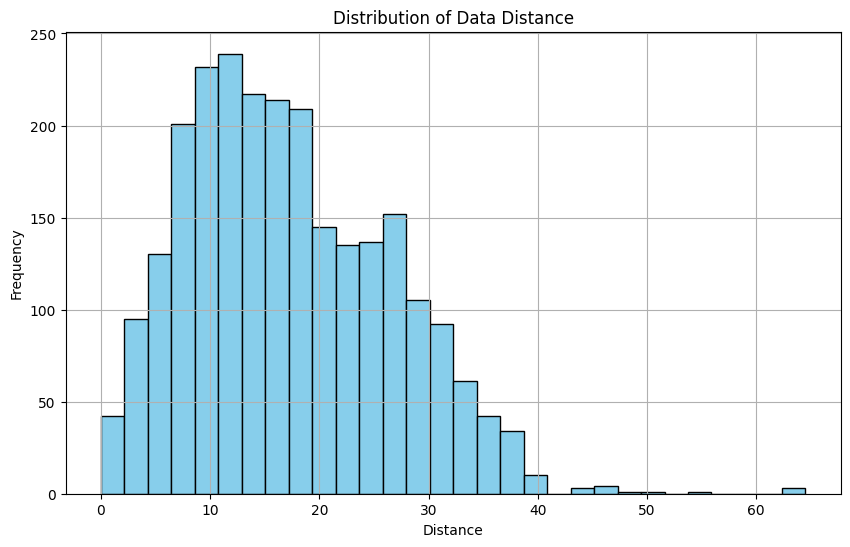

In [ ]:
import matplotlib.pyplot as plt

# Histogram of 'data distance'
plt.figure(figsize=(10, 6))
plt.hist(gpd_df['distance'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Data Distance')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


In [ ]:
sim_data_df = [census_block_groups,cgb] 
sim_df = pd.concat(sim_data_df, axis =1)

gpd_df = gpd.GeoDataFrame(sim_df).drop_duplicates()
gpd_df

,level_0,index,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid,distance,phi_value
0,0,0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((-111.78406 33.41540, -111.78259 33.4...","(-111.7788867, 33.4123043)",16.894636,0.569410
1,1,1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((-112.37679 33.64389, -112.37673 33.6...","(-112.3722104, 33.642266)",20.805550,0.499814
2,2,2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((-112.20294 33.56672, -112.20293 33.5...","(-112.198936, 33.5654583)",9.532489,0.385487
3,3,5,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((-112.25507 33.53763, -112.25507 33.5...","(-112.2472748, 33.5408739)",11.759818,0.675708
4,4,6,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((-112.18194 33.50955, -112.18193 33.5...","(-112.1797305, 33.5113085)",7.710596,0.462523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,2500,4139,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((-111.87111 33.28352, -111.87031 33.2...","(-111.8638617, 33.2801026)",19.216529,0.527002
2501,2501,4140,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((-111.85867 33.28374, -111.85848 33.2...","(-111.8501034, 33.2802159)",19.655371,0.519349
2502,2502,4141,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((-111.85885 33.29153, -111.85853 33.2...","(-111.8502128, 33.2876864)",19.231211,0.526744
2503,2503,4176,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((-111.85910 33.30737, -111.85908 33.3...","(-111.8546715, 33.3097028)",17.860793,0.551364


In [ ]:
short_distance_threshold = 10  # 0-10 km
medium_distance_threshold = 100  # 10-100 km

# Categorize each row based on distance
gpd_df['distance_category'] = gpd_df['distance'].apply(
    lambda x: 'short' if x <= short_distance_threshold else ('medium' if x < medium_distance_threshold else 'long')
)
gpd_df

,level_0,index,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid,distance,phi_value,distance_category
0,0,0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((-111.78406 33.41540, -111.78259 33.4...","(-111.7788867, 33.4123043)",16.894636,0.569410,medium
1,1,1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((-112.37679 33.64389, -112.37673 33.6...","(-112.3722104, 33.642266)",20.805550,0.499814,medium
2,2,2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((-112.20294 33.56672, -112.20293 33.5...","(-112.198936, 33.5654583)",9.532489,0.385487,short
3,3,5,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((-112.25507 33.53763, -112.25507 33.5...","(-112.2472748, 33.5408739)",11.759818,0.675708,medium
4,4,6,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((-112.18194 33.50955, -112.18193 33.5...","(-112.1797305, 33.5113085)",7.710596,0.462523,short
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,2500,4139,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((-111.87111 33.28352, -111.87031 33.2...","(-111.8638617, 33.2801026)",19.216529,0.527002,medium
2501,2501,4140,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((-111.85867 33.28374, -111.85848 33.2...","(-111.8501034, 33.2802159)",19.655371,0.519349,medium
2502,2502,4141,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((-111.85885 33.29153, -111.85853 33.2...","(-111.8502128, 33.2876864)",19.231211,0.526744,medium
2503,2503,4176,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((-111.85910 33.30737, -111.85908 33.3...","(-111.8546715, 33.3097028)",17.860793,0.551364,medium


In [ ]:
gpd_df['distance_category'].unique()

array(['medium', 'short'], dtype=object)

In [ ]:
color_mappings = {
    'short': 'Blues',
    'medium': 'Greens',
}

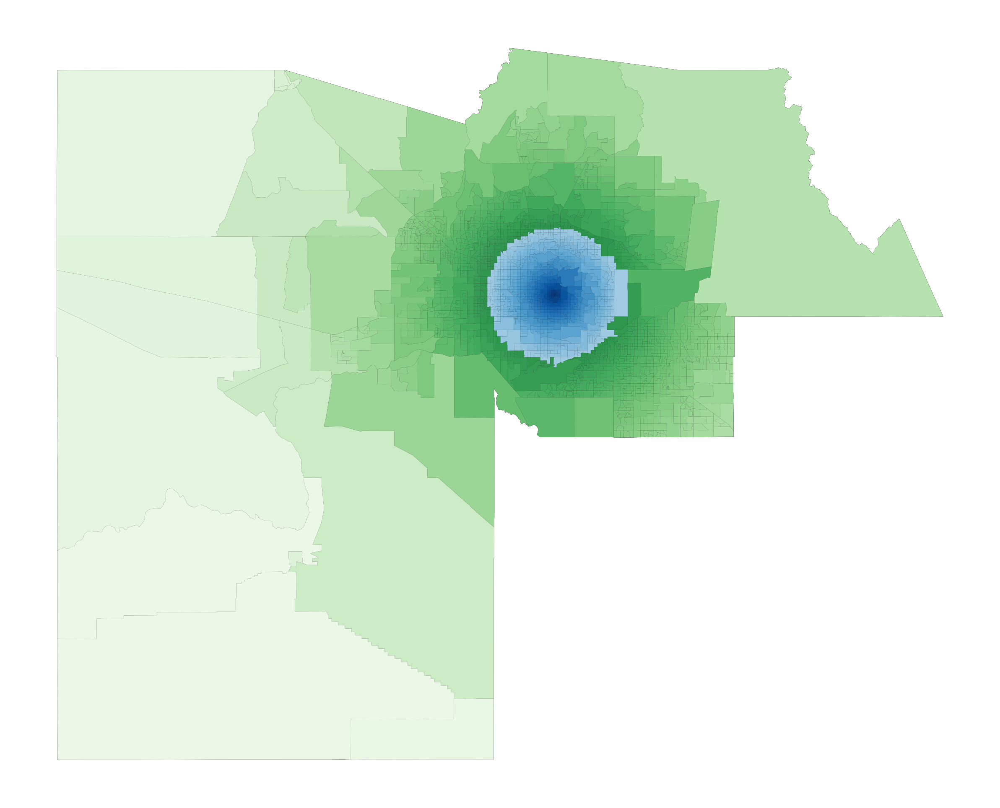

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

# Assuming your base map plot works correctly
census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='grey',
    linewidth=0.1
)

# Simplified plot for each category without the color bar
for category, color in color_mappings.items():
    gpd_df[gpd_df['distance_category'] == category].plot(
        ax=ax,
        edgecolor='black',
        column='phi_value',
        legend=False,
        cmap=color,
        vmin=0,
        vmax=1,
        linewidth=0.005,
        # Removed the cax parameter for simplification
    )

ax.axis('off')

plt.show()


NameError: name 'census_block_groups' is not defined

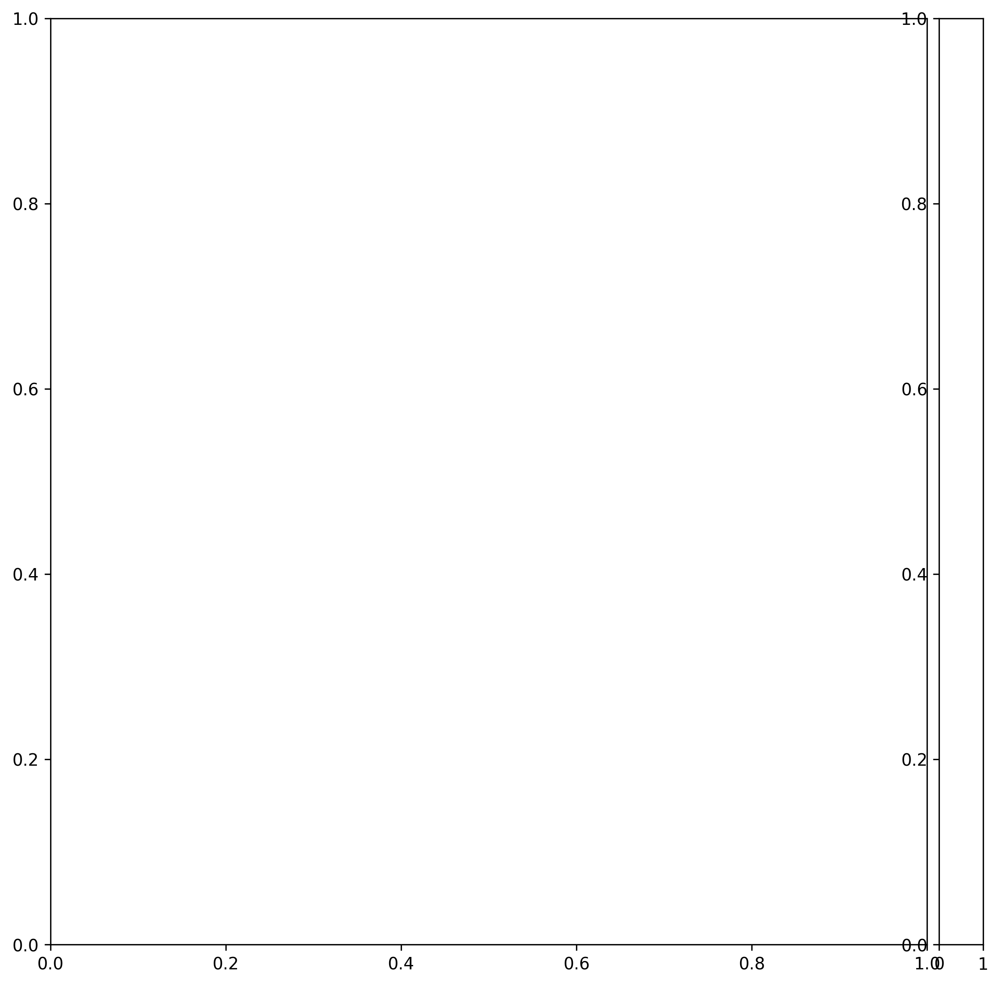

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Plot the base map
census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='grey',
    linewidth=0.1
)

# Plot each distance category with a different color scheme
color_mappings = {
    'short': 'Blues',
    'medium': 'Greens',
    'long': 'Reds'
}

for category, color in color_mappings.items():
    gpd_df[gpd_df['distance_category'] == category].plot(
        ax=ax,
        edgecolor='black',
        column='phi_value',  # Color-coded by 'phi_value'
        legend=True,
        cmap=color, 
        vmin=0,
        vmax=1,
        linewidth=0.005,
        cax=cax,
        legend_kwds={"label": 'Probability of movement', "orientation": "vertical"},
    )

# Set the title and turn off the axis
ax.set_title('Maricopa Geo')
ax.axis('off')

# Show the plot
plt.show()


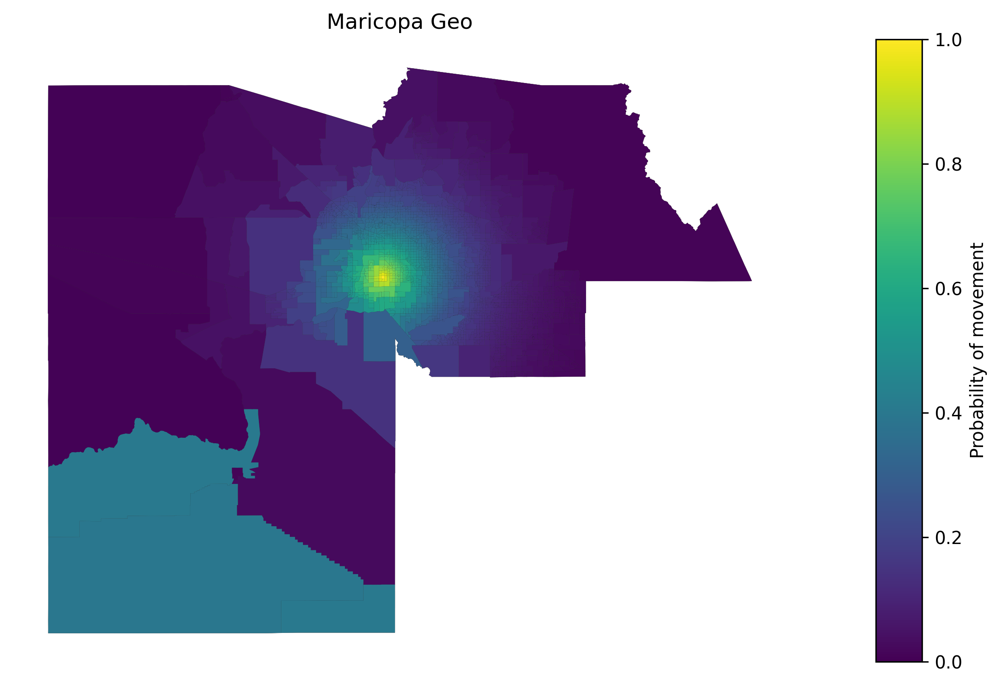

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)


# Plot the map
census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='grey',
    linewidth=0.1
)

gpd_df.plot(
    ax=ax,
    edgecolor='black',
    column='phi_value',
    legend=True,
    cmap='viridis', 
    vmin=0,
    vmax=1,
    linewidth=0.005,
    cax=cax,
    legend_kwds={"label": 'Probability of movement', "orientation": "vertical"},
)

# Set the title
ax.set_title('Maricopa Geo')
ax.axis('off')
# Saves map

# Show the plot
plt.show()

# Data for good


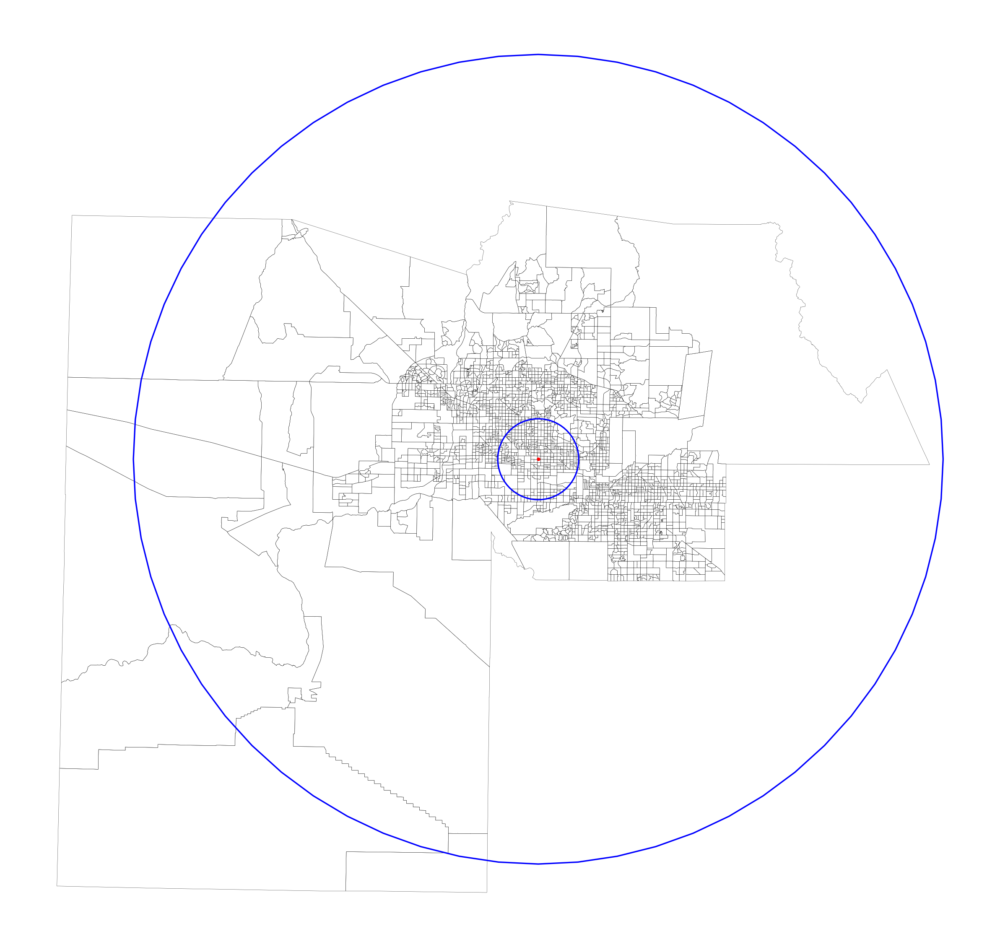

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
census_block_groups.plot(linewidth=0.1, ax=ax, edgecolor='black', color='none')

CBG = Point(-112.08022800920108, 33.473284493195884)

census_block_groups = census_block_groups.to_crs(epsg=26912)

CBG_series = GeoSeries([CBG], crs="EPSG:4326")
CBG_projected = CBG_series.to_crs(epsg=26912)

for x, y in zip(CBG_projected.geometry.x, CBG_projected.geometry.y):
    ax.plot(x, y, marker='o', color='red', markersize=1)

circle_10km = CBG_projected.geometry.iloc[0].buffer(10000)  
circle_100km = CBG_projected.geometry.iloc[0].buffer(100000)  

circles = GeoSeries([circle_10km, circle_100km], crs=census_block_groups.crs)
circles.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=0.8)

ax.axis('off')
plt.show()


In [ ]:
import pandas as pd
import os
from datetime import datetime, timedelta

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Data_for_good'

maricopa_gadm_id = "USA.3.3_1" # Coconino

all_data = pd.DataFrame()

folders = [f for f in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, f)) and 'movement-distribution-data-for-good-at-meta' in f]

for folder in folders:
    print(f"Processing folder: {folder}")
    folder_path = os.path.join(base_path, folder)
    
    
    dates = folder.split('_')[-3:-1]  
    start_date = datetime.strptime(dates[0], '%Y-%m-%d')
    end_date = datetime.strptime(dates[1], '%Y-%m-%d')
    
    current_date = start_date
    while current_date < end_date:
        filename = f"1922039342088483_{current_date.strftime('%Y-%m-%d')}.csv"
        file_path = os.path.join(folder_path, filename)
        
        if os.path.exists(file_path):
            data = pd.read_csv(file_path)
            
            filtered_data = data[data['gadm_id'] == maricopa_gadm_id].copy()
            filtered_data.loc[:, 'date'] = current_date.strftime('%Y-%m-%d')
            
            all_data = pd.concat([all_data, filtered_data], ignore_index=True)
        
        current_date += timedelta(days=1)

all_data

Processing folder: movement-distribution-data-for-good-at-meta_2023-10-01_2023-11-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-05-01_2023-06-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2022-12-01_2023-01-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-03-01_2023-04-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-01-01_2023-02-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-08-01_2023-09-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-07-01_2023-08-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-04-01_2023-05-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-09-01_2023-10-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-11-01_2023-12-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-02-01_2023-03-01_csv
Processing folder: mo

,gadm_id,gadm_name,country,polygon_level,home_to_ping_distance_category,distance_category_ping_fraction,ds,date
0,USA.3.3_1,Coconino,USA,2,"[10, 100)",0.051006,2023-10-01,2023-10-01
1,USA.3.3_1,Coconino,USA,2,100+,0.082384,2023-10-01,2023-10-01
2,USA.3.3_1,Coconino,USA,2,0,0.379718,2023-10-01,2023-10-01
3,USA.3.3_1,Coconino,USA,2,"(0, 10)",0.486844,2023-10-01,2023-10-01
4,USA.3.3_1,Coconino,USA,2,"[10, 100)",0.072622,2023-10-02,2023-10-02
...,...,...,...,...,...,...,...,...
1455,USA.3.3_1,Coconino,USA,2,0,0.341075,2023-06-29,2023-06-29
1456,USA.3.3_1,Coconino,USA,2,0,0.331294,2023-06-30,2023-06-30
1457,USA.3.3_1,Coconino,USA,2,"(0, 10)",0.485700,2023-06-30,2023-06-30
1458,USA.3.3_1,Coconino,USA,2,"[10, 100)",0.070094,2023-06-30,2023-06-30


In [ ]:
maricopa_gadm_id = "USA.3.8_1"  
maricopa_gadm_id = "USA.33.32_1" # New York
maricopa_gadm_id = "USA.3.10_1" # Navajo 
maricopa_gadm_id = "USA.3.3_1" # Coconino


In [ ]:
import pandas as pd
import os
from datetime import datetime, timedelta

# Base directory and file pattern
base_dir = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Data_for_good/movement-distribution-data-for-good-at-meta_2023-08-01_2023-09-01_csv'
file_pattern = "1922039342088483_{}.csv"

maricopa_gadm_id = "USA.3.10_1"

start_date = datetime(2023, 8, 1)
end_date = datetime(2023, 9, 1)

combined_data = pd.DataFrame()

current_date = start_date
while current_date <= end_date:
    filename = file_pattern.format(current_date.strftime('%Y-%m-%d'))
    file_path = os.path.join(base_dir, filename)
    
    if os.path.exists(file_path):
        data = pd.read_csv(file_path)
        filtered_data = data[data['gadm_id'] == maricopa_gadm_id]
        
        combined_data = pd.concat([combined_data, filtered_data], ignore_index=True)
    else:
        print(f"File not found: {file_path}")
    
    current_date += timedelta(days=1)

combined_data

,gadm_id,gadm_name,country,polygon_level,home_to_ping_distance_category,distance_category_ping_fraction,ds
0,USA.3.10_1,Navajo,USA,2,100+,0.044267,2023-08-01
1,USA.3.10_1,Navajo,USA,2,0,0.365612,2023-08-01
2,USA.3.10_1,Navajo,USA,2,"(0, 10)",0.500713,2023-08-01
3,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.089387,2023-08-01
4,USA.3.10_1,Navajo,USA,2,100+,0.042726,2023-08-02
...,...,...,...,...,...,...,...
123,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.091554,2023-08-31
124,USA.3.10_1,Navajo,USA,2,"(0, 10)",0.466517,2023-09-01
125,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.085282,2023-09-01
126,USA.3.10_1,Navajo,USA,2,0,0.347786,2023-09-01


In [ ]:
all_data['ds'] = pd.to_datetime(all_data['ds'])

grouped_data = all_data.groupby(['ds', 'home_to_ping_distance_category'])['distance_category_ping_fraction'].mean().reset_index()

pivot_data = grouped_data.pivot(index='ds', columns='home_to_ping_distance_category', values='distance_category_ping_fraction')
pivot_data

home_to_ping_distance_category,"(0, 10)",0,100+,"[10, 100)"
ds,,,,
2022-12-01,0.532040,0.345305,0.054453,0.068275
2022-12-02,0.508853,0.343127,0.079330,0.068453
2022-12-03,0.503541,0.373870,0.064570,0.058019
2022-12-04,0.499483,0.390998,0.065335,0.044206
2022-12-05,0.527786,0.360414,0.044363,0.067531
...,...,...,...,...
2023-11-26,0.482123,0.384930,0.090473,0.042432
2023-11-27,0.514917,0.369592,0.050461,0.065135
2023-11-28,0.527508,0.363236,0.039004,0.070223


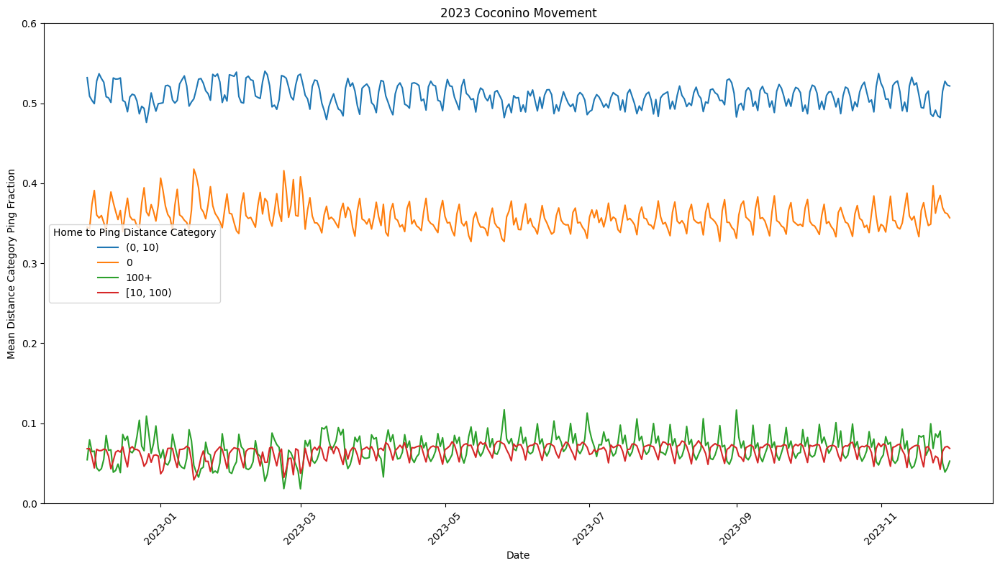

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
for category in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[category], label=category)

plt.title(f"2023 {all_data['gadm_name'][0]} Movement")
plt.xlabel('Date')
plt.ylabel('Mean Distance Category Ping Fraction')
plt.legend(title='Home to Ping Distance Category', loc='best')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.ylim(0, 0.6)  
plt.show()



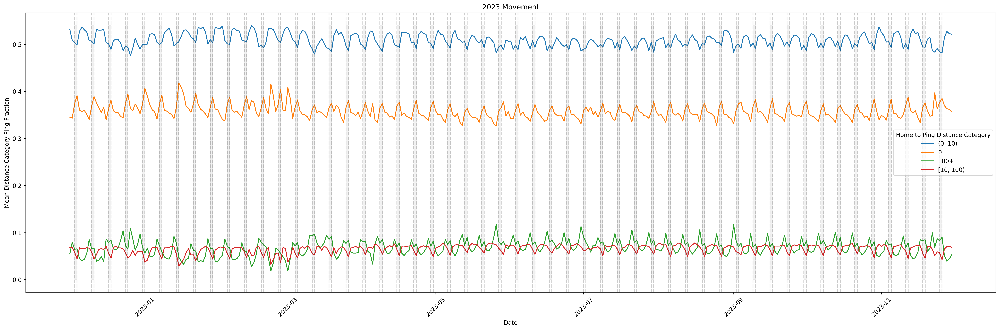

In [ ]:
plt.figure(figsize=(24, 8), dpi = 300)

for category in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[category], label=category)

weekends = pivot_data.index[pivot_data.index.weekday >= 5]  

for day in weekends:
    plt.axvline(day, color='k', linestyle='--', alpha=0.2) 

    if day.weekday() == 5:  
        if day + pd.Timedelta(days=1) in pivot_data.index:  
            plt.fill_betweenx(np.arange(0, pivot_data.max().max(), 0.01), day, day + pd.Timedelta(days=1), color='grey', alpha=0.1)

plt.title('2023 Movement')
plt.xlabel('Date')
plt.ylabel('Mean Distance Category Ping Fraction')
plt.legend(title='Home to Ping Distance Category')
plt.xticks(rotation=45) 
plt.tight_layout()  
plt.show()

In [ ]:
def calculate_sheep_shorn_before_eric(sheep_in_front):
    # For every sheep shorn, Eric moves past 2 sheep.
    # The formula to calculate how many sheep will be shorn before Eric is shorn can be derived from the pattern.
    results = {}
    for sheep_count in sheep_in_front:
        steps = 0
        while sheep_count > 0:
            sheep_count -= 3  # One sheep is shorn, and Eric moves past two.
            steps += 1
        results[sheep_count] = steps
    return results

# Define the number of sheep in front of Eric for each scenario.
sheep_in_front = [8, 10, 11, 12, 13, 15, 16, 100, 1000]

# Calculate the number of sheep shorn before Eric for each scenario.
results = calculate_sheep_shorn_before_eric(sheep_in_front)
results


{-1: 4, -2: 334, 0: 5}

In [ ]:
 LOAD spatial;
 LOAD azure;

 -- Access the data on Microsoft Azure in this example
 SET azure_storage_connection_string = 'DefaultEndpointsProtocol=https;AccountName=overturemapswestus2;AccountKey=;EndpointSuffix=core.windows.net';
 COPY (
     SELECT
         FILTER(names.common, x -> x.language = 'local')[1].value as name,
         height,
         level,
         CAST(sources AS JSON) as sources,
         ST_GeomFromWKB(geometry) as geometry
     FROM read_parquet('azure://release/2023-11-14-alpha.0/theme=buildings/type=building/*', filename=true, hive_partitioning=1)
     WHERE bbox.minX > -122.679404 AND bbox.maxX < -121.978275
     AND bbox.minY > 47.360619 AND bbox.maxY < 47.786336
 ) TO 'buildings.geojsonseq'
 WITH (FORMAT GDAL, DRIVER 'GeoJSONSeq', SRS 'EPSG:4326');

SyntaxError: invalid syntax (3385627266.py, line 1)

In [ ]:
SELECT class, height, level,
    TRY(FILTER(names.common, x -> x.language = 'local')[1].value) as name,
    ST_ASTEXT(ST_GeomFromBinary(geometry)) as geometry_wkt
FROM overture_2023_10_19_alpha_0
WHERE theme = 'buildings' AND type = 'building'
    AND bbox.minX > -122.679404 AND bbox.maxX < -121.978275
    AND bbox.minY > 47.360619 AND bbox.maxY < 47.786336

SyntaxError: invalid syntax (1517729336.py, line 1)

In [ ]:
config = SedonaContext.builder().getOrCreate()
sedona = SedonaContext(config)

The operation couldn’t be completed. Unable to locate a Java Runtime.
Please visit http://www.java.com for information on installing Java.

/Users/alexandernez/Desktop/Github/Epymorph_vignettes/.venv/lib/python3.11/site-packages/pyspark/bin/spark-class: line 97: CMD: bad array subscript
head: illegal line count -- -1


PySparkRuntimeError: [JAVA_GATEWAY_EXITED] Java gateway process exited before sending its port number.

In [ ]:
from pyspark.sql import SparkSession
from sedona.register import SedonaRegistrator
from sedona.utils import KryoSerializer, SedonaKryoRegistrator

# Initialize Spark Session with Sedona configuration
spark = SparkSession.builder \
    .appName("SedonaApp") \
    .config("spark.serializer", KryoSerializer.getName) \
    .config("spark.kryo.registrator", SedonaKryoRegistrator.getName) \
    .config("fs.s3a.aws.credentials.provider", "org.apache.hadoop.fs.s3a.AnonymousAWSCredentialsProvider") \
    .getOrCreate()

# Register Sedona functions
SedonaRegistrator.registerAll(spark)

# Read GeoParquet data
df = spark.read.format("geoparquet").load("s3a://overturemaps-us-west-2/release/2024-03-12-alpha.0/theme=places/type=place")

# Perform spatial query
df.filter("ST_Contains(ST_GeomFromWKT('POLYGON((-122.48 47.43,-122.20 47.75,-121.92 47.37,-122.48 47.43))'), geometry) = true").show()


The operation couldn’t be completed. Unable to locate a Java Runtime.
Please visit http://www.java.com for information on installing Java.

/Users/alexandernez/Desktop/Github/Epymorph_vignettes/.venv/lib/python3.11/site-packages/pyspark/bin/spark-class: line 97: CMD: bad array subscript
head: illegal line count -- -1


PySparkRuntimeError: [JAVA_GATEWAY_EXITED] Java gateway process exited before sending its port number.

In [ ]:
infected_statest = ['CA', 'AZ', 'WA', 'MN', 'LA', 'MO', 'IL', 'IN', 'MI', 'OH', 'PA', 'NY', 'NJ', 'VA', 'MD', 'GA', 'FL']


17

/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_28419/278840751.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


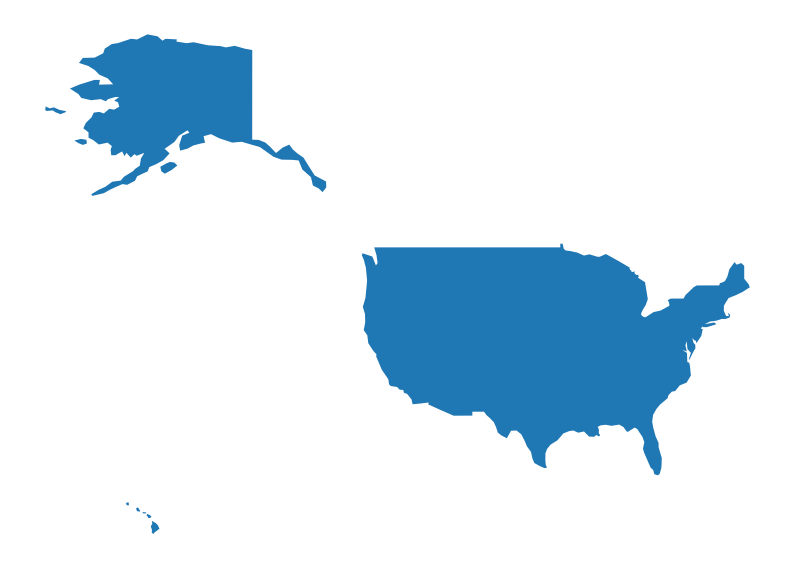

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the dataset of the United States
gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf = gdf[gdf['continent'] == 'North America']

# Filter out Alaska and Hawaii
gdf = gdf[gdf['name'] == 'United States of America']

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax)
plt.axis('off')
plt.show()


In [14]:
from pygris import states 

USA = states()
USA

Using the default year of 2021


,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,56,01779807,0400000US56,56,WY,Wyoming,00,251458712294,1867503716,"POLYGON ((-111.05456 45.00095, -111.04507 45.0..."
1,02,01785533,0400000US02,02,AK,Alaska,00,1478942847588,245378425142,"MULTIPOLYGON (((179.48246 51.98283, 179.48657 ..."
2,24,01714934,0400000US24,24,MD,Maryland,00,25151992308,6979074857,"MULTIPOLYGON (((-76.05015 37.98691, -76.04998 ..."
3,60,01802701,0400000US60,60,AS,American Samoa,00,197759069,1307243751,"MULTIPOLYGON (((-168.14582 -14.54791, -168.145..."
4,05,00068085,0400000US05,05,AR,Arkansas,00,134660767709,3121950081,"POLYGON ((-94.61792 36.49941, -94.61765 36.499..."
5,38,01779797,0400000US38,38,ND,North Dakota,00,178694310772,4414779956,"POLYGON ((-104.04868 48.86378, -104.04865 48.8..."
6,10,01779781,0400000US10,10,DE,Delaware,00,5046731559,1399179670,"MULTIPOLYGON (((-75.56555 39.51485, -75.56174 ..."
7,66,01802705,0400000US66,66,GU,Guam,00,543555847,934337453,"MULTIPOLYGON (((144.64538 13.23627, 144.64764 ..."
8,35,00897535,0400000US35,35,NM,New Mexico,00,314198560947,726482113,"POLYGON ((-109.05017 31.48000, -109.04984 31.4..."
9,49,01455989,0400000US49,49,UT,Utah,00,213355072799,6529973239,"POLYGON ((-114.05296 37.59278, -114.05247 37.6..."


In [ ]:
USA

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,56,01779807,0400000US56,56,WY,Wyoming,00,251458712294,1867503716,"POLYGON ((-111.05456 45.00095, -111.04507 45.0..."
2,24,01714934,0400000US24,24,MD,Maryland,00,25151992308,6979074857,"MULTIPOLYGON (((-76.05015 37.98691, -76.04998 ..."
3,60,01802701,0400000US60,60,AS,American Samoa,00,197759069,1307243751,"MULTIPOLYGON (((-168.14582 -14.54791, -168.145..."
4,05,00068085,0400000US05,05,AR,Arkansas,00,134660767709,3121950081,"POLYGON ((-94.61792 36.49941, -94.61765 36.499..."
5,38,01779797,0400000US38,38,ND,North Dakota,00,178694310772,4414779956,"POLYGON ((-104.04868 48.86378, -104.04865 48.8..."
6,10,01779781,0400000US10,10,DE,Delaware,00,5046731559,1399179670,"MULTIPOLYGON (((-75.56555 39.51485, -75.56174 ..."
8,35,00897535,0400000US35,35,NM,New Mexico,00,314198560947,726482113,"POLYGON ((-109.05017 31.48000, -109.04984 31.4..."
9,49,01455989,0400000US49,49,UT,Utah,00,213355072799,6529973239,"POLYGON ((-114.05296 37.59278, -114.05247 37.6..."
10,54,01779805,0400000US54,54,WV,West Virginia,00,62266298634,489204185,"POLYGON ((-82.64320 38.16909, -82.64300 38.169..."
11,20,00481813,0400000US20,20,KS,Kansas,00,211753717642,1345767737,"POLYGON ((-102.05174 40.00308, -101.91670 40.0..."


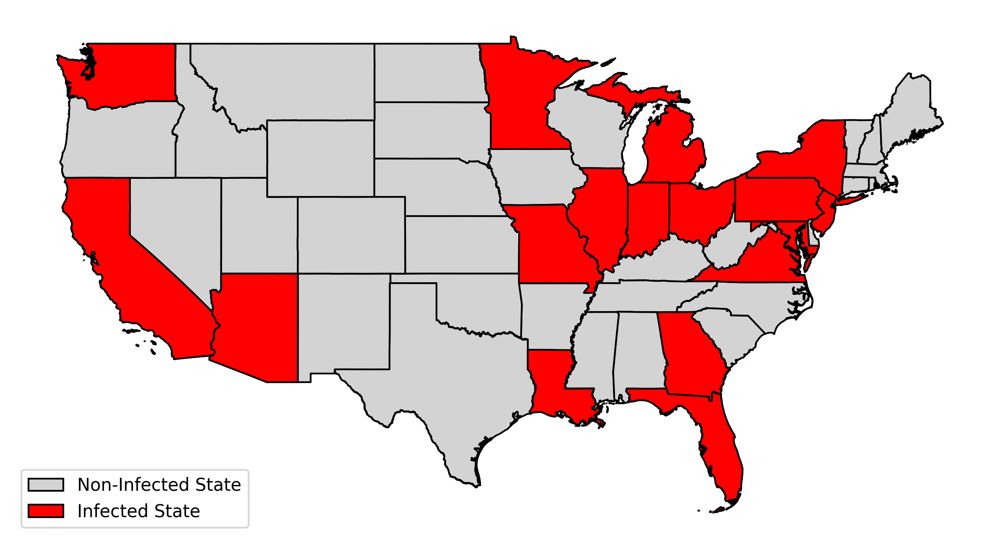

In [18]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

infected_states = ['CA', 'AZ', 'WA', 'MN', 'LA', 'MO', 'IL', 'IN', 'MI', 'OH', 'PA', 'NY', 'NJ', 'VA', 'MD', 'GA', 'FL']

USA = USA[~USA['STUSPS'].isin(['AK', 'HI', 'GU', 'MP', 'VI', 'PR', 'AS'])]

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

USA.plot(ax=ax, color='lightgrey', linewidth=1, edgecolor='black')

USA[USA['STUSPS'].isin(infected_states)].plot(ax=ax, color='red', linewidth=1, edgecolor='black')

legend_elements = [
    Patch(facecolor='lightgrey', edgecolor='black', label='Non-Infected State'),
    Patch(facecolor='red', edgecolor='black', label='Infected State')
]
ax.legend(handles=legend_elements, loc='lower left')

plt.axis('off')
plt.show()